# **1. IMPORT AND SET THE SEED**




------------------------------------------
*This notebook is only for training purpose*




In [0]:
# Seed value
seed_value= 0
 
# 1. Set `PYTHONHASHSEED` environment variable at a fixed value
import os
os.environ['PYTHONHASHSEED']=str(seed_value)
 
# 2. Set `python` built-in pseudo-random generator at a fixed value
import random
random.seed(seed_value)
 
# 3. Set `numpy` pseudo-random generator at a fixed value
import numpy as np
np.random.seed(seed_value)
 
# 4. Set `tensorflow` pseudo-random generator at a fixed value
import tensorflow as tf
tf.random.set_seed(seed_value)
 
# 5. Configure a new global `tensorflow` session
session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)

In [2]:
# import the necessary
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras.backend as K

import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
import seaborn as sns
import pandas as pd
import cv2 as cv2
import datetime
import math
import time
import os
import csv

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

SystemError: ignored

# **2. DATASET PREPROCESSING**

In [0]:
# Load the data from the csv file.
# path = path to your csv file
path = '/content/drive/My Drive/datasets/facial-expression/fer2013/new-fer2013-dataset-balanced.csv'
fer_dataset = pd.read_csv(path)
# fer_dataset_aug = pd.read_csv(path1)

In [0]:
# Shuffle the dataset 
fer_dataset = fer_dataset.sample(frac=1, random_state=seed_value).reset_index(drop=True)

In [0]:
# Function for normalizing the dataset
# input_set: dataset 
# scaler: the scaler for normalize
# @return: dataset with normalized data
def normalizeSet(input_set, scaler):
  x = scaler.fit_transform(input_set)
  return x

# The function for getting the pixels as a list 
# input_set: dataset 
# @return: an array of flattened images
def getPixels(input_set):
  pixels = input_set['pixels'].tolist()
  new_pixels = []
  for pixel_sequence in pixels:
    image = [int(pixel) for pixel in pixel_sequence.split(' ')]
    new_pixels.append(image)
  return np.asarray(new_pixels, dtype='float32')  

# The function for reshpping the dataset
# cutsize: if True the image will be cutted
# input_set: dataset with only pixels (# the return of the getPixels(input_set))
def reshapeDataset(input_set, cutsize=False):
  new_input_set = []
  for image in input_set:
    # reshape the image in (48, 48) shape
    image = image.reshape((48, 48))
    
    # # resize the image in (44, 44) shape
    # if cutsize:
    #   image = cv2.resize(image,(44, 44))

    # add new axis for being in (48, 48, 1) shape
    image = image[:, :, np.newaxis]

    # reshape in (48, 48, 3) shape by concatenating 3 times the image
    # image = np.concatenate((image, image, image), axis=2)
    new_input_set.append(image)
  return np.asarray(new_input_set, dtype='float32')

# This function is going to help with normalizing and reshapping a set
def normalize_reshape_set(input_set, scaler, cutsize):
  images = getPixels(input_set)
  print('Done with pixels of images')

  images = normalizeSet(images,scaler)
  print('Done normalizing the images')

  reshapped_images = reshapeDataset(images,cutsize)
  print('Done reshaping the images')

  return reshapped_images

In [0]:
# We want to preparing the data set for normalizing part

# 1. Split the data frame for training, data for validation,data for testing
data_for_training = fer_dataset[fer_dataset['Usage'] == 'Training']

data_for_validation = fer_dataset[fer_dataset['Usage'] == 'PublicTest']
data_for_testing = fer_dataset[fer_dataset['Usage'] == 'PrivateTest']

# Print the shape of the sets
print('Train shape = ',data_for_training.shape)
print('Validation shape = ',data_for_validation.shape)
print('Test shape = ',data_for_testing.shape)

Train shape =  (35368, 3)
Validation shape =  (4394, 3)
Test shape =  (4387, 3)


In [0]:
# 2. Drop the column Usage from train, validation and test sets
data_for_training = data_for_training.drop(['Usage'],axis=1)
data_for_validation = data_for_validation.drop(['Usage'],axis=1)
data_for_testing = data_for_testing.drop(['Usage'],axis=1)

In [0]:
# 3. Split the data in X and y format; 
#    X stands for the column 'pixels' from original dataframe and y stands for column 'emotion' from original dataset
#    The partitioning will be: X_train, y_train, X_validation, y_validation, X_test, y_test

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

X_train = normalize_reshape_set(data_for_training, scaler, cutsize = False)
X_val = normalize_reshape_set(data_for_validation, scaler, cutsize = True)
X_test = normalize_reshape_set(data_for_testing, scaler, cutsize = True)

y_train = np.asarray(data_for_training['emotion'], dtype='int32')
y_val = np.asarray(data_for_validation['emotion'], dtype='int32')
y_test = np.asarray(data_for_testing['emotion'], dtype='int32')

Done with pixels of images
Done normalizing the images
Done reshaping the images
Done with pixels of images
Done normalizing the images
Done reshaping the images
Done with pixels of images
Done normalizing the images
Done reshaping the images


In [0]:
# Let's check the shape of every set
print('X_train = ',X_train.shape)
print('X_val = ', X_val.shape)
print('X_test = ', X_test.shape)

X_train =  (35368, 48, 48, 1)
X_val =  (4394, 48, 48, 1)
X_test =  (4387, 48, 48, 1)


# **3.1. OFFLINE DATA AUGMENTATION**

Text(0.5, 1.0, 'Data partitioning')

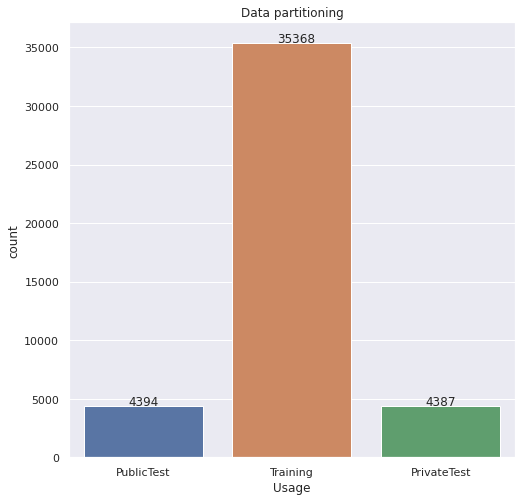

In [0]:
# In order to check how data is partitioned we're going to do a counter plot
# The PublicTest will be used for validation
# The PrivateTest will be used for testing
plt.figure(figsize = (8,8))
sns.set(style="darkgrid")
ax = sns.countplot(fer_dataset['Usage'], label='Count')
for p in ax.patches:
        ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+50))
plt.title('Data partitioning')

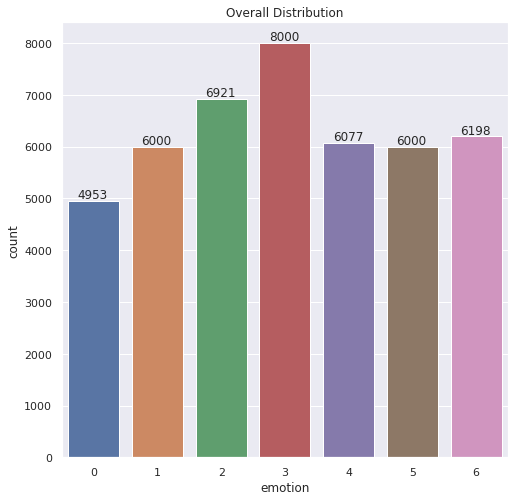

0 = Angry
1 = Disgust
2 = Fear
3 = Happy
4 = Sad
5 = Surprise
6 = Neutral


In [0]:
# Get the distribution of the data before augmentation
plt.figure(figsize = (8,8))
sns.set(style="darkgrid")
ax = sns.countplot(fer_dataset['emotion'], label='Count')
for p in ax.patches:
        ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+50))
plt.title('Overall Distribution')
plt.show()
print('0 = Angry\n1 = Disgust\n2 = Fear\n3 = Happy\n4 = Sad\n5 = Surprise\n6 = Neutral')

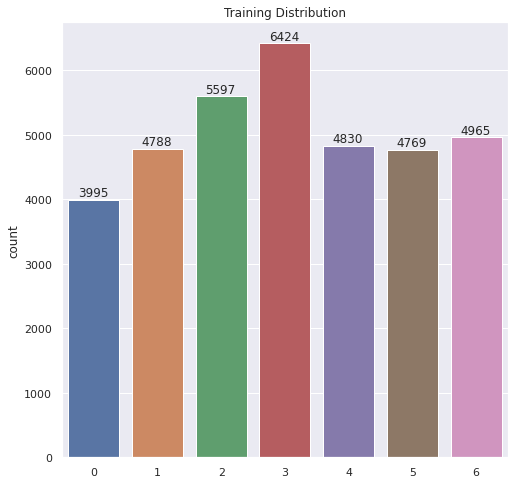

0 = Angry
1 = Disgust
2 = Fear
3 = Happy
4 = Sad
5 = Surprise
6 = Neutral


In [0]:
# Get the distribution of the data before augmentation
plt.figure(figsize = (8,8))
sns.set(style="darkgrid")
ax = sns.countplot(y_train, label='Count')
for p in ax.patches:
        ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+50))
plt.title('Training Distribution')
plt.show()
print('0 = Angry\n1 = Disgust\n2 = Fear\n3 = Happy\n4 = Sad\n5 = Surprise\n6 = Neutral')

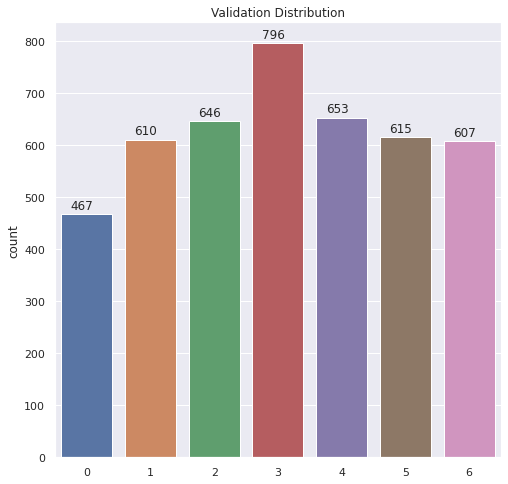

In [0]:
plt.figure(figsize = (8,8))
sns.set(style="darkgrid")
ax = sns.countplot(y_val, label='Count')
for p in ax.patches:
        ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+10))
plt.title('Validation Distribution')
plt.show()

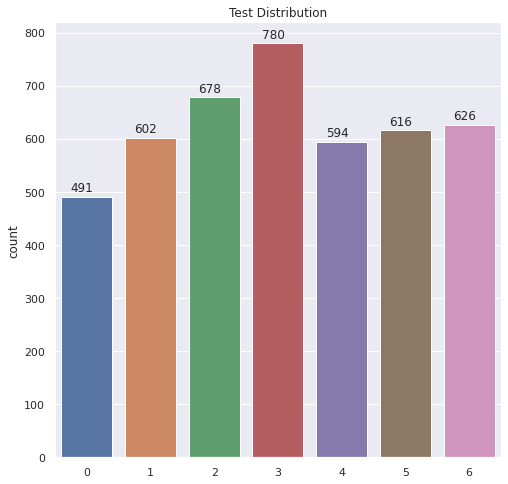

In [0]:
plt.figure(figsize = (8,8))
sns.set(style="darkgrid")
ax = sns.countplot(y_test, label='Count')
for p in ax.patches:
        ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.15, p.get_height()+10))
plt.title('Test Distribution')
plt.show()

In [0]:
# Get the distribution of the data after augmentation
def generateRotationData(dataset):
  gen = ImageDataGenerator()
  rotation_images = np.asarray([gen.apply_transform(dataset[i],{'rotation_range': 45})for i in range(len(dataset))])
  return rotation_images

In [0]:
def generateFlippedData(dataset):
  gen = ImageDataGenerator()
  flipped_images = np.asarray([gen.apply_transform(dataset[i],{'flip_horizontal': True})for i in range(len(dataset))])
  return flipped_images


In [0]:
x_tf = generateFlippedData(X_train)
x_tr = generateRotationData(X_train)

In [0]:
import csv

In [0]:
def makeDataAugmentation_flipped(x,y,filename,usage):
  for i in range(len(x)):
    # Get the image, the label and usage
    image = x[i]
    label = y[i]
    usage = usage
    # Apply flip to the image
    flipped_image = gen.apply_transform(image,{'flip_horizontal': True})

    # Flattening the image
    flipped_image = flipped_image.reshape(flipped_image.shape[0]*flipped_image.shape[1])

    # Transform the pixels into strings
    string_image =' '.join([str(int(pixel)) for pixel in flipped_image]) 

    # Write to csv the image with the label 
    with open(filename, mode='a') as images_file:
      images_writer = csv.writer(images_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
      images_writer.writerow([label, string_image, usage])
    print('Done with image ' + str(i))

In [0]:
def makeDataAugmentation_rotation(x,y,filename,usage):
  for i in range(len(x)):
    # Get the image, the label and usage
    image = x[i]
    label = y[i]
    usage = usage
    # Apply rotation to the image
    rotated_image = gen.apply_transform(image,{'theta': 30})

    # Flattening the image
    rotated_image = rotated_image.reshape(rotated_image.shape[0]*rotated_image.shape[1])

    # Transform the pixels into strings
    string_image =' '.join([str(int(pixel)) for pixel in rotated_image]) 

    # Write to csv the image with the label 
    with open(filename, mode='a') as images_file:
      images_writer = csv.writer(images_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
      images_writer.writerow([label, string_image, usage])
    print('Done with image ' + str(i))

In [0]:
gen = ImageDataGenerator()

In [0]:
def makeDataAugmentation_brightness_on_class(x,class_label,filename,usage):
  for i in range(len(x)):
    # Get the image, the label and usage
    image = x[i]
    label = class_label
    usage = usage
    # Apply rotation to the image
    brightness_image = gen.apply_transform(image,{'brightness': 1.2})

    # Flattening the image
    brightness_image = brightness_image.reshape(brightness_image.shape[0]*brightness_image.shape[1])

    # Transform the pixels into strings
    string_image =' '.join([str(int(pixel)) for pixel in brightness_image]) 

    # Write to csv the image with the label 
    with open(filename, mode='a') as images_file:
      images_writer = csv.writer(images_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
      images_writer.writerow([label, string_image, usage])
    print('Done with image ' + str(i) +'on the ' + usage)

In [0]:
# Function which get the whole images on a specific class
def get_image_class(x,y,class_code):
  return np.asarray([x[i] for i in range(len(y)) if y[i] == class_code])

In [0]:
# 1. Flip each image in the training set
# makeDataAugmentation_flipped(X_train,y_train,'/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_augmented.csv', 'Training')

# 2. Flip each image in the validation set
# makeDataAugmentation_flipped(X_val,y_val,'/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_augmented.csv', 'PublicTest')

# 3. Flip each image in the test set
# makeDataAugmentation_flipped(X_test,y_test,'/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_augmented.csv', 'PrivateTest')

# 4. Rotate each image in the training set 
# makeDataAugmentation_rotation(X_train,y_train,'/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_augmented.csv', 'Training')

# 5. Rotate each image in the validation set
# makeDataAugmentation_rotation(X_val,y_val,'/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_augmented.csv', 'PublicTest')

# 6. Rotate each image in the test set
# makeDataAugmentation_rotation(X_test,y_test,'/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_augmented.csv', 'PrivateTest')

# 7. Increase the number of images on the training set for class 1
# disgust_imgs_train = get_image_class(X_train,y_train,1)
# makeDataAugmentation_brightness_on_class(disgust_imgs_train,1,'/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_augmented.csv', 'Training')

# 8. Increase the number of images on the validation set class 1
# disgust_imgs_val = get_image_class(X_val,y_val,1)
# makeDataAugmentation_brightness_on_class(disgust_imgs_val,1,'/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_augmented.csv', 'PublicTest')

# 9. Increase the number of images on the test set class 1
# disgust_imgs_test = get_image_class(X_test,y_test,1)
# makeDataAugmentation_brightness_on_class(disgust_imgs_test,1,'/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_augmented.csv', 'PrivateTest')


# **3.2 ONLINE DATA AUGMENTATION**

In [0]:
data_generator_train = ImageDataGenerator(
    rotation_range=10,
    horizontal_flip=True)

data_generator_val = ImageDataGenerator(
    rotation_range=10,
    horizontal_flip=True)

train_generator = data_generator_train.flow(X_train, y_train, batch_size=batch_size,seed=seed_value)
val_generator = data_generator_val.flow(X_val, y_val, batch_size=batch_size,seed=seed_value)

# **4. SET PARAMETERS**

In [0]:
# FOR TUNNING
NUMBER_OF_EPOCHS = 600
# FOR TUNNING

number_classes = 7
number_features = 32
growthRate = 8

verbosity = 1
# num_samples = X_train.shape[0]
# num_samples_val = X_val.shape[0]

learning_rate_decay_start = 80
learning_rate_decay_every = 5
learning_rate_decay_rate = 0.9

version = "v0.0.1"
loss_function = 'sparse_categorical_crossentropy'

# filepath = "/content/drive/My Drive/FaceX/tests/ReduceLROnPlateau/"+version+"/weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
filepath = "/content/weights-improvement-{epoch:02d}-{val_accuracy:.2f}.hdf5"
# GOOD VALUE
initial_learning_rate = 0.000001
batch_size = 64
lambd = 0.0005
regularizer = tf.keras.regularizers.l1(lambd)
# steps = math.ceil(num_samples / batch_size)
# steps_validation = math.ceil(num_samples_val / batch_size)
# GOOD VALUE

# **5. ADD LEARNING RATE SCHEDULE**

In [0]:
# This function only get the parameters for learning rate scheduler
def get_setup_learning_rate_schedule():
  # for production code you should read them from the config file
  return (learning_rate_decay_start, learning_rate_decay_every, learning_rate_decay_rate, initial_learning_rate)

In [0]:
def step_decay(epoch):
  learning_rate_decay_start, learning_rate_decay_every, learning_rate_decay_rate, initial_learning_rate = get_setup_learning_rate_schedule()
  if (epoch > learning_rate_decay_start):
    frac = (epoch - learning_rate_decay_start) // learning_rate_decay_every
    decay_factor = learning_rate_decay_rate ** frac
    initial_learning_rate = initial_learning_rate * decay_factor
    return initial_learning_rate
  else: return initial_learning_rate
  # self.lr.append(step_decay(len(self.losses)))

In [0]:
class LearningRateHistory(tf.keras.callbacks.Callback):
  def __init__(self):
    self.lr = []
    
  def on_train_begin(self, logs={}):
    self.lr = []

  def on_epoch_end(self, batch, logs={}):
    # print('\n LR = ' + str(self.model.optimizer.lr))
    self.lr.append(self.model.optimizer.lr)
    

In [0]:
class LearningRateSchedulerMedian(tf.keras.callbacks.Callback):

  def __init__(self,n, threshold, percent_of_decreasing_lr):
    super(LearningRateSchedulerMedian, self).__init__()
    self.threshold = threshold
    self.n = n
    self.percent_of_decreasing_lr = percent_of_decreasing_lr
  def on_train_begin(self, logs={}):
    self.val_losses = []
    self.learning_rate = []
    self.global_median = 0


  def on_epoch_end(self, batch, logs={}):
    self.val_losses.append(logs.get('val_loss'))

  def getLearningRate(self,currentLearningRate, epoch):
    if epoch % self.n == 0 :
      current_median = np.median(self.val_losses[-self.n:])
      if current_median < self.global_median:
        # self.global_median = current_median
        print('\n Global Median = ' + str(self.global_median))
        print('\n Current Median = ' + str(current_median))

        subtraction_result = self.global_median - current_median
        print('\n Subtraction_result = ' + str(subtraction_result))
        percent_of_loss_decreasing = round((subtraction_result * 100)/self.global_median ,2)
        print('\n percent_of_loss_decreasing = {:5.2f}%'.format(percent_of_loss_decreasing))
        
        #Update the global_median
        self.global_median = current_median

        if percent_of_loss_decreasing <= self.threshold:
          new_lr = currentLearningRate - (currentLearningRate * self.percent_of_decreasing_lr)
          return new_lr
        else: return currentLearningRate
      else:
        return currentLearningRate
    else:
      return currentLearningRate

  def init_parameters(self):
    print('\n Init the parameters...')
    self.global_median = np.median(self.val_losses[-self.n:])
    print('Init Median = ' + str(self.global_median))

  def on_epoch_begin(self, epoch, logs=None):
    if epoch >= self.n:
      if epoch == self.n:
        self.init_parameters()
      else:
        if not hasattr(self.model.optimizer, 'lr'):
          raise ValueError('Optimizer must have a "lr" attribute.')
        # Get the current learning rate from model's optimizer.
        lr = float(tf.keras.backend.get_value(self.model.optimizer.lr))

        # Call schedule function to get the scheduled learning rate.
        scheduled_lr = self.getLearningRate(currentLearningRate=lr, epoch = epoch)

        # Set the value back to the optimizer before this epoch starts
        tf.keras.backend.set_value(self.model.optimizer.lr, scheduled_lr)
        print('\nEpoch %05d: Learning rate is %6.4f.' % (epoch, scheduled_lr))
    self.learning_rate.append(self.model.optimizer.lr)

In [0]:
class CustomLearningRateScheduler(tf.keras.callbacks.Callback):
  """Learning rate scheduler which sets the learning rate according to schedule.

  Arguments:
      schedule: a function that takes an epoch index
          (integer, indexed from 0) and current learning rate
          as inputs and returns a new learning rate as output (float).
  """

  def __init__(self,n, threshold, percent_of_decreasing_lr):
    super(CustomLearningRateScheduler, self).__init__()
    self.threshold = threshold
    self.n = n
    self.percent_of_decreasing_lr = percent_of_decreasing_lr
  def on_train_begin(self, logs={}):
    self.val_losses = []
    self.learning_rate = []
    self.index_of_current_batch_loss = 1
    self.prev_max_min_subtraction = 0

  def on_epoch_end(self, batch, logs={}):
    self.val_losses.append(logs.get('val_loss'))

  def getLearningRate(self,currentLearningRate, epoch):
    if epoch % self.n == 0 :
      # Get last n values
      min_on_n_epochs = min(self.val_losses[-self.n:])
      max_on_n_epochs = max(self.val_losses[-self.n:])

      current_max_min_subtraction = max_on_n_epochs - min_on_n_epochs
      print('\n min_on_n_epochs = ' + str(min_on_n_epochs))
      print('\n max_on_n_epochs = ' + str(max_on_n_epochs))
      print('\n self.prev_max_min_subtraction = ' + str(self.prev_max_min_subtraction))
      print('\n current_max_min_subtraction = ' + str(current_max_min_subtraction))
      
      if self.prev_max_min_subtraction > current_max_min_subtraction:
        # get the percent of decreasing
        subtraction_result = self.prev_max_min_subtraction - current_max_min_subtraction
        print('\n subtraction_result = ' + str(subtraction_result))

        percent_of_loss_decreasing = round((subtraction_result * 100)/self.prev_max_min_subtraction ,2)
        print('\n percent_of_loss_decreasing = {:5.2f}%'.format(percent_of_loss_decreasing))

        if percent_of_loss_decreasing <= self.threshold:
          # decrease the learning rate 
          new_lr = currentLearningRate - (currentLearningRate * self.percent_of_decreasing_lr)
          self.prev_max_min_subtraction = current_max_min_subtraction
          return new_lr
        else: 
          self.prev_max_min_subtraction = current_max_min_subtraction
          return currentLearningRate

      else: 
        self.prev_max_min_subtraction = current_max_min_subtraction
        return currentLearningRate
        
    else: 
      return currentLearningRate
  def init_parameters(self):
    print('\n Init the parameters...')
    min_init = min(self.val_losses[-self.n:])
    max_init = max(self.val_losses[-self.n:])

    self.prev_max_min_subtraction = max_init - min_init
    print('\n min_init = ' + str(min_init))
    print('\n max_init = ' + str(max_init))
    print('\n self.prev_max_min_subtraction = ' + str(self.prev_max_min_subtraction))
  def on_epoch_begin(self, epoch, logs=None):
    if epoch >= self.n:
      if epoch == self.n:
        self.init_parameters()
      else:
        if not hasattr(self.model.optimizer, 'lr'):
          raise ValueError('Optimizer must have a "lr" attribute.')
        # Get the current learning rate from model's optimizer.
        lr = float(tf.keras.backend.get_value(self.model.optimizer.lr))

        # Call schedule function to get the scheduled learning rate.
        scheduled_lr = self.getLearningRate(currentLearningRate=lr, epoch = epoch)

        # Set the value back to the optimizer before this epoch starts
        tf.keras.backend.set_value(self.model.optimizer.lr, scheduled_lr)
        print('\nEpoch %05d: Learning rate is %6.4f.' % (epoch, scheduled_lr))
    self.learning_rate.append(self.model.optimizer.lr)

# **LEARNING RATE FINDER**

In [0]:
class LRFinder(tf.keras.callbacks.Callback):
    
    '''
    A simple callback for finding the optimal learning rate range for your model + dataset. 
    
    # Usage
        ```python
            lr_finder = LRFinder(min_lr=1e-5, 
                                 max_lr=1e-2, 
                                 steps_per_epoch=np.ceil(epoch_size/batch_size), 
                                 epochs=3)
            model.fit(X_train, Y_train, callbacks=[lr_finder])
            
            lr_finder.plot_loss()
        ```
    
    # Arguments
        min_lr: The lower bound of the learning rate range for the experiment.
        max_lr: The upper bound of the learning rate range for the experiment.
        steps_per_epoch: Number of mini-batches in the dataset. Calculated as `np.ceil(epoch_size/batch_size)`. 
        epochs: Number of epochs to run experiment. Usually between 2 and 4 epochs is sufficient. 
        
    # References
        Blog post: jeremyjordan.me/nn-learning-rate
        Original paper: https://arxiv.org/abs/1506.01186
    '''
    
    def __init__(self, min_lr=1e-5, max_lr=1e-2, steps_per_epoch=None, epochs=None):
        super().__init__()
        
        self.min_lr = min_lr
        self.max_lr = max_lr
        self.total_iterations = steps_per_epoch * epochs
        self.iteration = 0
        self.history = {}
        
    def clr(self):
        '''Calculate the learning rate.'''
        x = self.iteration / self.total_iterations 
        return self.min_lr + (self.max_lr-self.min_lr) * x
        
    def on_train_begin(self, logs=None):
        '''Initialize the learning rate to the minimum value at the start of training.'''
        logs = logs or {}
        K.set_value(self.model.optimizer.lr, self.min_lr)
        
    def on_batch_end(self, epoch, logs=None):
        '''Record previous batch statistics and update the learning rate.'''
        logs = logs or {}
        self.iteration += 1

        self.history.setdefault('lr', []).append(K.get_value(self.model.optimizer.lr))
        self.history.setdefault('iterations', []).append(self.iteration)

        for k, v in logs.items():
            self.history.setdefault(k, []).append(v)
            
        K.set_value(self.model.optimizer.lr, self.clr())
 
    def plot_lr(self):
        '''Helper function to quickly inspect the learning rate schedule.'''
        plt.plot(self.history['iterations'], self.history['lr'])
        plt.yscale('log')
        plt.xlabel('Iteration')
        plt.ylabel('Learning rate')
        plt.show()
        
    def plot_loss(self):
        '''Helper function to quickly observe the learning rate experiment results.'''
        plt.plot(self.history['lr'], self.history['loss'])
        plt.xscale('log')
        plt.xlabel('Learning rate')
        plt.ylabel('Loss')
        plt.show()

In [0]:
class CyclicLR(tf.keras.callbacks.Callback):
    """This callback implements a cyclical learning rate policy (CLR).
    The method cycles the learning rate between two boundaries with
    some constant frequency, as detailed in this paper (https://arxiv.org/abs/1506.01186).
    The amplitude of the cycle can be scaled on a per-iteration or 
    per-cycle basis.
    This class has three built-in policies, as put forth in the paper.
    "triangular":
        A basic triangular cycle w/ no amplitude scaling.
    "triangular2":
        A basic triangular cycle that scales initial amplitude by half each cycle.
    "exp_range":
        A cycle that scales initial amplitude by gamma**(cycle iterations) at each 
        cycle iteration.
    For more detail, please see paper.
    
    # Example
        ```python
            clr = CyclicLR(base_lr=0.001, max_lr=0.006,
                                step_size=2000., mode='triangular')
            model.fit(X_train, Y_train, callbacks=[clr])
        ```
    
    Class also supports custom scaling functions:
        ```python
            clr_fn = lambda x: 0.5*(1+np.sin(x*np.pi/2.))
            clr = CyclicLR(base_lr=0.001, max_lr=0.006,
                                step_size=2000., scale_fn=clr_fn,
                                scale_mode='cycle')
            model.fit(X_train, Y_train, callbacks=[clr])
        ```    
    # Arguments
        base_lr: initial learning rate which is the
            lower boundary in the cycle.
        max_lr: upper boundary in the cycle. Functionally,
            it defines the cycle amplitude (max_lr - base_lr).
            The lr at any cycle is the sum of base_lr
            and some scaling of the amplitude; therefore 
            max_lr may not actually be reached depending on
            scaling function.
        step_size: number of training iterations per
            half cycle. Authors suggest setting step_size
            2-8 x training iterations in epoch.
        mode: one of {triangular, triangular2, exp_range}.
            Default 'triangular'.
            Values correspond to policies detailed above.
            If scale_fn is not None, this argument is ignored.
        gamma: constant in 'exp_range' scaling function:
            gamma**(cycle iterations)
        scale_fn: Custom scaling policy defined by a single
            argument lambda function, where 
            0 <= scale_fn(x) <= 1 for all x >= 0.
            mode paramater is ignored 
        scale_mode: {'cycle', 'iterations'}.
            Defines whether scale_fn is evaluated on 
            cycle number or cycle iterations (training
            iterations since start of cycle). Default is 'cycle'.
    """

    def __init__(self, base_lr=0.001, max_lr=0.006, step_size=2000., mode='triangular',
                 gamma=1., scale_fn=None, scale_mode='cycle'):
        super(CyclicLR, self).__init__()

        self.base_lr = base_lr
        self.max_lr = max_lr
        self.step_size = step_size
        self.mode = mode
        self.gamma = gamma
        if scale_fn == None:
            if self.mode == 'triangular':
                self.scale_fn = lambda x: 1.
                self.scale_mode = 'cycle'
            elif self.mode == 'triangular2':
                self.scale_fn = lambda x: 1/(2.**(x-1))
                self.scale_mode = 'cycle'
            elif self.mode == 'exp_range':
                self.scale_fn = lambda x: gamma**(x)
                self.scale_mode = 'iterations'
        else:
            self.scale_fn = scale_fn
            self.scale_mode = scale_mode
        self.clr_iterations = 0.
        self.trn_iterations = 0.
        self.history = {}

        self._reset()

    def _reset(self, new_base_lr=None, new_max_lr=None,
               new_step_size=None):
        """Resets cycle iterations.
        Optional boundary/step size adjustment.
        """
        if new_base_lr != None:
            self.base_lr = new_base_lr
        if new_max_lr != None:
            self.max_lr = new_max_lr
        if new_step_size != None:
            self.step_size = new_step_size
        self.clr_iterations = 0.
        
    def clr(self):
        cycle = np.floor(1+self.clr_iterations/(2*self.step_size))
        x = np.abs(self.clr_iterations/self.step_size - 2*cycle + 1)
        if self.scale_mode == 'cycle':
            return self.base_lr + (self.max_lr-self.base_lr)*np.maximum(0, (1-x))*self.scale_fn(cycle)
        else:
            return self.base_lr + (self.max_lr-self.base_lr)*np.maximum(0, (1-x))*self.scale_fn(self.clr_iterations)
        
    def on_train_begin(self, logs={}):
        logs = logs or {}

        if self.clr_iterations == 0:
            K.set_value(self.model.optimizer.lr, self.base_lr)
        else:
            K.set_value(self.model.optimizer.lr, self.clr())        
            
    def on_batch_end(self, epoch, logs=None):
        
        logs = logs or {}
        self.trn_iterations += 1
        self.clr_iterations += 1

        self.history.setdefault('lr', []).append(K.get_value(self.model.optimizer.lr))
        self.history.setdefault('iterations', []).append(self.trn_iterations)

        for k, v in logs.items():
            self.history.setdefault(k, []).append(v)
        
        K.set_value(self.model.optimizer.lr, self.clr())

# **MY ADAPTIVE LEARNING RATE**

# **6. IMPLEMENTATION OF ARCHITECTURE**

In [0]:
# Let's make the EdgeCNN arhictecture based on DenseNet, but with some additional changes in order to work well on Raspberry Pi 4
from tensorflow.keras import layers, models, Model

In [0]:
# Create the function for Edge convolution block
# x: input layer 
# growthRate: how many filter we want fot output
# @return: the layer after applying convolution block 1 and 2
def EdgeBlock(x, growthRate, name):
  # Convolution block 1
  x = layers.Conv2D(4 * growthRate, kernel_size = 3, kernel_regularizer = regularizer,padding = 'same', name='conv1_dense' + name)(x)
  x = layers.BatchNormalization(name='batchnorm1_dense' + name)(x)
  x = layers.ReLU(name='relu_dense'+name)(x)

  # Convolution block 2
  x = layers.Conv2D(1 * growthRate, kernel_size = 3, kernel_regularizer = regularizer, padding = 'same', name='conv2_dense' + name)(x)
  x = layers.BatchNormalization(name='batchnorm2_dense' + name)(x)
  return x

# Create the function for Dense Block
# input_layer: the layer on which we apply the EdgeBlock function of 'repetition' times 
# growthRate: how many filter we want for output
# name: name of the denseblock densenumber_
# @return: concatenated layers after applying the EdgeBlock of 'repetition' times
def denseBlock(input_layer, repetition, growthRate, name):
  for i in range(repetition):
    # apply the convolution block 1 and 2
    x = EdgeBlock(input_layer, growthRate,str(name)+'_'+str(i))
    # concatenate with the input layer
    input_layer = layers.Concatenate()([input_layer,x])
  return input_layer

# Create the transition layer
# input_layer: the layer on which we apply average pooling
# name: name of the layer
# @return: the layer with average pooling applied
def transitionLayer(input_layer, name):
  input_layer = layers.AveragePooling2D((2,2), strides = 2, name = 'transition_'+str(name))(input_layer)
  return input_layer

In [0]:
input_shape = (48,48,1)
input_net = layers.Input(input_shape)
# First layer of convolution
x = layers.Conv2D(number_features,(3,3), kernel_regularizer = regularizer,padding = 'same', use_bias = True, strides = 1, name='conv0')(input_net)
x = layers.MaxPool2D((3,3),padding = 'same',strides = 2, name='pool0')(x)

# Add the Dense layers
repetitions = 4, 4, 7

layer_index = 1
for repetition in repetitions:
  dense_block = denseBlock(x, repetition, growthRate,name=layer_index)
  x = transitionLayer(dense_block, name=layer_index)
  layer_index+=1

x = layers.GlobalAveragePooling2D(data_format='channels_last')(dense_block)

output_layer = layers.Dense(number_classes, activation='softmax', kernel_regularizer = regularizer)(x)

In [0]:
EdgeCNN_sgd_optimizer = Model(input_net, output_layer)

In [0]:
len(EdgeCNN_sgd_optimizer.layers)

97

In [0]:
EdgeCNN_sgd_optimizer.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 48, 48, 1)]  0                                            
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, 48, 48, 32)   320         input_1[0][0]                    
__________________________________________________________________________________________________
pool0 (MaxPooling2D)            (None, 24, 24, 32)   0           conv0[0][0]                      
__________________________________________________________________________________________________
conv1_dense1_0 (Conv2D)         (None, 24, 24, 32)   9248        pool0[0][0]                      
______________________________________________________________________________________________

# **SET TENSORBOARD**

In [0]:
log_dir="/content/drive/My Drive/FaceX/tests/ReduceLROnPlateau/v0.0.1/logs2/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [0]:
%load_ext tensorboard


%tensorboard --logdir /content/drive/My\ Drive/FaceX/tests/ReduceLROnPlateau/v0.0.1/logs2/

Output hidden; open in https://colab.research.google.com to view.

# **SET CHECKPOINT**

In [0]:
class EpochCheckpoint(tf.keras.callbacks.Callback):
	def __init__(self, outputPath, every=5, startAt=0):
		# call the parent constructor
		super(tf.keras.callbacks.Callback, self).__init__()

		# store the base output path for the model, the number of
		# epochs that must pass before the model is serialized to
		# disk and the current epoch value
		self.outputPath = outputPath
		self.every = every
		self.intEpoch = startAt

	def on_epoch_end(self, epoch, logs={}):
		# check to see if the model should be serialized to disk
		if (self.intEpoch + 1) % self.every == 0:
			p = os.path.sep.join([self.outputPath,
				"epoch_{}.hdf5".format(self.intEpoch + 1)])
			self.model.save(p, overwrite=True)

		# increment the internal epoch counter
		self.intEpoch += 1

# **7. COMPILE THE MODEL**

**SET OPTIMIZERS**

In [0]:
# SGD OPTIMIZER
sgd_optimizer = tf.optimizers.SGD(learning_rate=initial_learning_rate,  momentum=0.9)

In [0]:
# Let's compile the model
checkpoint_callback_sgd = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=2, save_best_only=True, mode='max')
# lr_finder = LRFinder(min_lr=1e-5, 
#                                  max_lr=1e-1, 
#                                  steps_per_epoch=np.ceil(num_samples/batch_size), 
#                                  epochs=NUMBER_OF_EPOCHS)
# clr = CyclicLR(base_lr=0.001, max_lr=0.006, step_size=2000., mode='triangular')
# path_to_save = '/content/drive/My Drive/FaceX/checkpoints'
# epoch_saving_checkpoint = EpochCheckpoint(path_to_save, every=5, startAt=20)
# learning_rate_history_callback = LearningRateHistory()
# custom_learning_rate_scheduler = LearningRateSchedulerMedian(n = 5,threshold=3.0,percent_of_decreasing_lr=0.1)

reducelr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.9, min_delta=1e-4, patience=5, verbose=1, mode='min', cooldown=0, min_lr=0)
# scheduler_lr = LearningRateScheduler(step_decay)

callbacks_list_sgd = [tensorboard_callback,checkpoint_callback_sgd, reducelr]

In [0]:
# SGD optimizer
EdgeCNN_sgd_optimizer.compile(
    optimizer = sgd_optimizer,
    loss = loss_function,
    metrics = ['accuracy']
)


# **8. FIT THE MODEL**

In [0]:
# Load the checkpooint
EdgeCNN_sgd_optimizer.load_weights('/content/drive/My Drive/FaceX/tests/ReduceLROnPlateau/v0.0.1/weights-improvement-319-0.66.hdf5')

In [0]:
EdgeCNN_sgd_optimizer.save('/content/facex_tflite')

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: /content/facex_tflite/assets


In [0]:
converter = tf.lite.TFLiteConverter.from_saved_model('/content/drive/My Drive/FaceX/tflite/facex_tflite')
tflite_model = converter.convert()

In [0]:
open("/content/drive/My Drive/FaceX/tflite/facial_expression.tflite", "wb").write(tflite_model)

1680344

In [0]:
start = time.time()
#Let's train the model
history = EdgeCNN_sgd_optimizer.fit(
    train_generator,
    steps_per_epoch=steps,
    verbose = verbosity,
    epochs = NUMBER_OF_EPOCHS,
    validation_data = val_generator,
    validation_steps = steps_validation, 
    callbacks=callbacks_list_sgd
)
# 
end = time.time()
hours, rem = divmod(end-start, 3600)
minutes, seconds = divmod(rem, 60)
print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

# start = time.time()
# history_sgd_optimizer = EdgeCNN_sgd_optimizer.fit(
#                                     X_train,
#                                     y_train,
#                                     shuffle=True,
#                                     random_state=seed_value,
#                                     batch_size=batch_size,
#                                     verbose = verbosity,
#                                     epochs = NUMBER_OF_EPOCHS,
#                                     validation_data = (X_val, y_val),
#                                     callbacks=callbacks_list_sgd
#                                 )
# end = time.time()
# hours, rem = divmod(end-start, 3600)
# minutes, seconds = divmod(rem, 60)
# print("{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))

Epoch 1/600


KeyboardInterrupt: ignored

# **9. EVALUATE THE MODEL**

In [0]:
accuracy_sgd = history.history['accuracy']
val_accuracy_sgd = history.history['val_accuracy']
loss_sgd = history.history['loss']
val_loss_sgd = history.history['val_loss']

In [0]:
with open("/content/val_loss2.txt", 'w') as output:
    for row in val_loss_sgd:
        output.write(str(row) + '\n')

In [0]:
accuracy_sgd

[0.24793274700641632,
 0.2474438101053238,
 0.24710069596767426,
 0.24764110147953033,
 0.24621719121932983,
 0.24777835607528687,
 0.24753816425800323,
 0.2487819492816925,
 0.2493995577096939,
 0.24940812587738037,
 0.24869617819786072,
 0.24896208941936493,
 0.24839594960212708,
 0.24782124161720276,
 0.24799279868602753,
 0.24720363318920135,
 0.24763253331184387,
 0.24814718961715698,
 0.247503861784935,
 0.2491765320301056]

In [0]:
max_accuracy = max(val_accuracy_sgd)
print('Max val accuracy: {:5.2f}%'.format(100*max_accuracy))
at_epoch = np.asarray(val_accuracy_sgd, dtype='float32').argmax()
print('At epoch: ' + str(at_epoch + 1))

Max val accuracy: 63.15%
At epoch: 156


In [0]:
def plot_metric(x,y1,y2,color1,color2,label1,label2, title):
  plt.subplots(figsize=(20,8))
  
  plt.plot(x, y1, 'b', label=label1, color=color1)
  plt.plot(x, y2, 'b', label=label2, color=color2)
  plt.title(title)
  plt.legend()

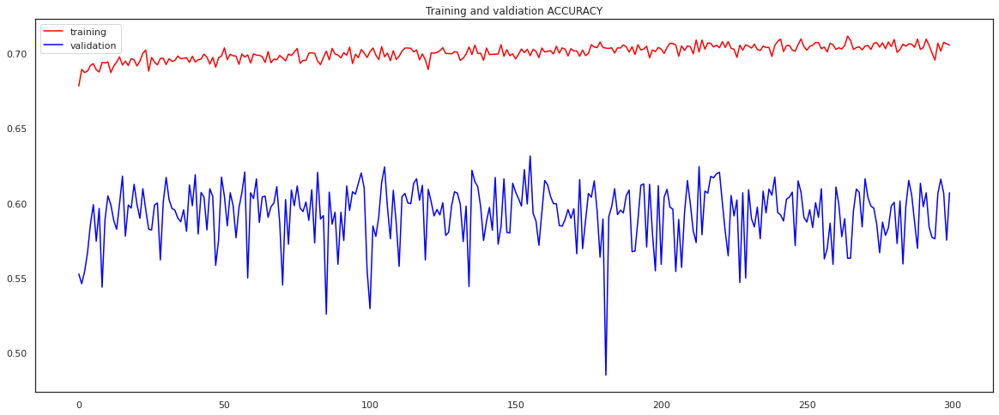

In [0]:
epochs = range(len(accuracy_sgd))
sns.set(style="white")
plot_metric(epochs,accuracy_sgd,val_accuracy_sgd, 'red','blue','training','validation', 'Training and valdiation ACCURACY')

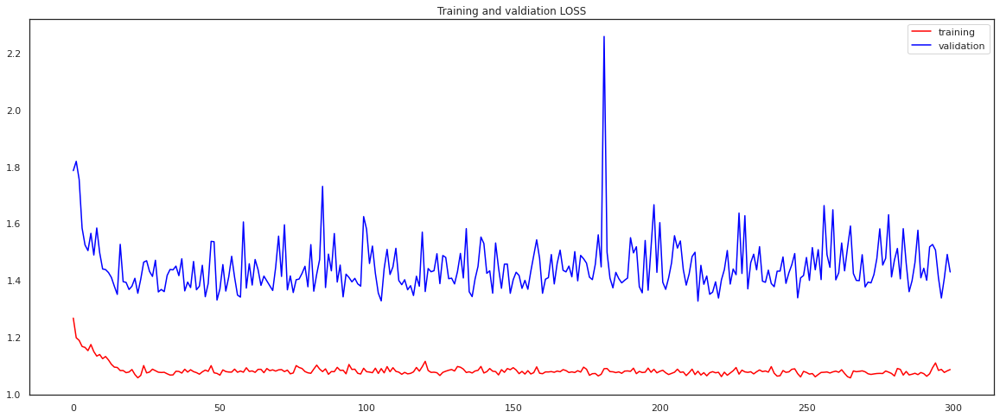

In [0]:
epochs = range(len(accuracy_sgd))
plot_metric(epochs,loss_sgd,val_loss_sgd, 'red','blue','training','validation', 'Training and valdiation LOSS')

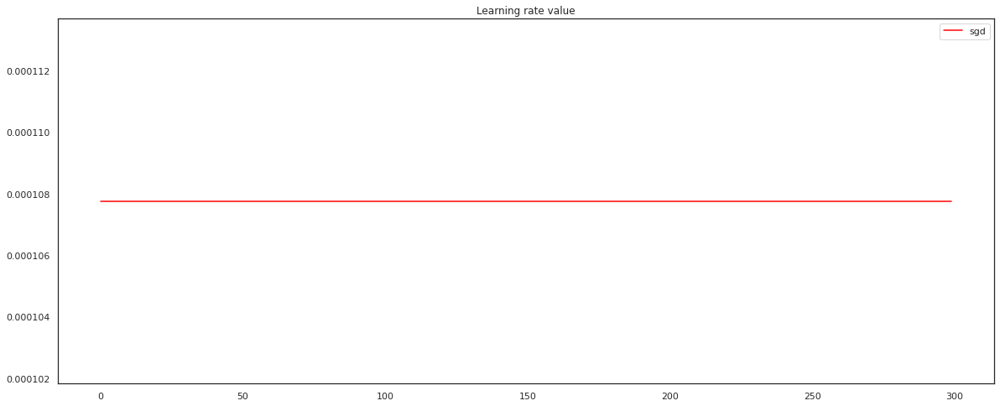

In [0]:
plt.subplots(figsize=(20,8))
plt.plot(epochs, learning_rate_history_callback.lr, 'b', label='sgd', color='red')
plt.title('Learning rate value')
plt.legend()

In [0]:
filepath

'/content/drive/My Drive/FaceX/models/EdgeCNN_v0.3.25.hdf5'

In [0]:
# NU UITA SA DAI COMPILE DIN NOU
EdgeCNN_sgd_optimizer.load_weights('/content/drive/My Drive/FaceX/tests/ReduceLROnPlateau/v0.0.1/weights-improvement-319-0.66.hdf5')

In [0]:
# Confusion Matrix
y_pred = EdgeCNN_sgd_optimizer.predict(X_test,batch_size=batch_size,verbose=1)

69/69 [==============================] - 2s 24ms/step


In [0]:
from sklearn import metrics

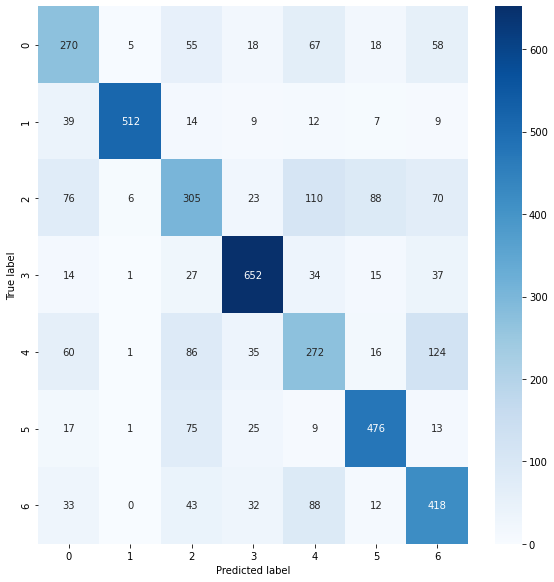

In [0]:
conf_matrix = metrics.confusion_matrix(y_test, y_pred.argmax(axis = 1))

figure = plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True,cmap=plt.cm.Blues, fmt="d")
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [0]:
y_test.shape

(4387,)

In [0]:
y_pred.shape

(14356, 7)

In [0]:
from sklearn.metrics import classification_report
class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
print(classification_report(y_test, y_pred.argmax(axis=1), target_names=class_names))

              precision    recall  f1-score   support

       Angry       0.53      0.55      0.54       491
     Disgust       0.97      0.85      0.91       602
        Fear       0.50      0.45      0.48       678
       Happy       0.82      0.84      0.83       780
         Sad       0.46      0.46      0.46       594
    Surprise       0.75      0.77      0.76       616
     Neutral       0.57      0.67      0.62       626

    accuracy                           0.66      4387
   macro avg       0.66      0.65      0.66      4387
weighted avg       0.67      0.66      0.66      4387



In [0]:
# Evaluate the model
loss, acc = EdgeCNN_sgd_optimizer.evaluate(X_test,  y_test,batch_size=batch_size, verbose=2)
print('Model, accuracy: {:5.2f}%'.format(100*acc))

69/69 - 1s - loss: 1.1919 - accuracy: 0.6622
Model, accuracy: 66.22%


In [0]:
roc_auc_score(y_test, y_pred,multi_class='ovr')

0.9137843100065608

# **10. SAVE THE MODEL**

In [0]:
path = '/content/drive/My Drive/FaceX/models/EdgeCNN_' +version+'.h5' 
EdgeCNN_sgd_optimizer.save(path)

# **TFLite Inference**

In [0]:
# Load TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="/content/drive/My Drive/FaceX/tflite/facial_expression.tflite")
interpreter.allocate_tensors()

# Get input and output tensors.
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Test model lite on the test set
y_pred = []
images = X_test
for image in images:
  # add one more axis
  image = image[np.newaxis,:,:]
  interpreter.set_tensor(input_details[0]['index'], image)
  interpreter.invoke()
  output_data = interpreter.get_tensor(output_details[0]['index'])
  y_pred.append(output_data)

In [0]:
y_pred = np.asarray(y_pred)

In [0]:
y_pred.shape

(4387, 1, 7)

In [0]:
y_pred_2 = y_pred.reshape((4387,7))


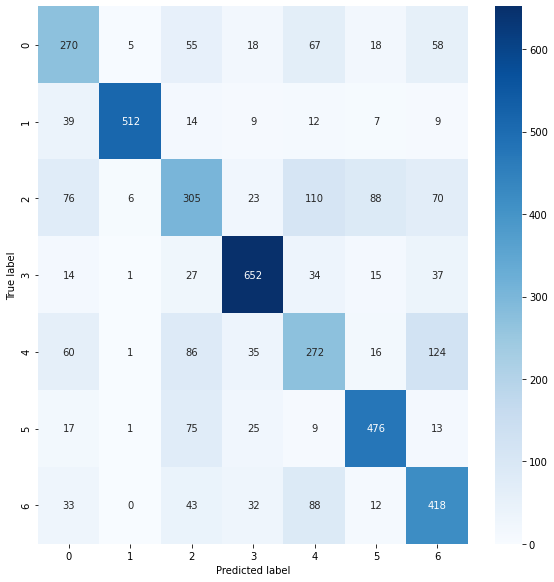

In [0]:
from sklearn import metrics
conf_matrix = metrics.confusion_matrix(y_test, y_pred_2.argmax(axis = 1))

figure = plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True,cmap=plt.cm.Blues, fmt="d")
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [0]:
from sklearn.metrics import classification_report
class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
print(classification_report(y_test, y_pred_2.argmax(axis=1), target_names=class_names))

              precision    recall  f1-score   support

       Angry       0.53      0.55      0.54       491
     Disgust       0.97      0.85      0.91       602
        Fear       0.50      0.45      0.48       678
       Happy       0.82      0.84      0.83       780
         Sad       0.46      0.46      0.46       594
    Surprise       0.75      0.77      0.76       616
     Neutral       0.57      0.67      0.62       626

    accuracy                           0.66      4387
   macro avg       0.66      0.65      0.66      4387
weighted avg       0.67      0.66      0.66      4387



# **In- depth analyze for classes**

In [0]:
path_to_bias_dataset = '/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_gender_age_race.csv'
fer_dataset = pd.read_csv(path_to_bias_dataset)

In [4]:
fer_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44149 entries, 0 to 44148
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   emotion  44149 non-null  int64 
 1   pixels   44149 non-null  object
 2   usage    44149 non-null  object
 3   age      44149 non-null  object
 4   gender   44149 non-null  object
 5   race     44149 non-null  int64 
dtypes: int64(2), object(4)
memory usage: 2.0+ MB


In [0]:
# Ordonare set de date dupa varsta
ageList={'(0-2)':'1.(0-2)' , '(4-6)':'2.(4-6)', '(8-12)':'3.(8-12)', '(15-20)':'4.(15-20)', '(25-32)':'5.(25-32)', '(38-43)':'6.(38-43)', '(48-53)':'7.(48-53)', '(60-100)':'8.(60-100)'}
fer_dataset = fer_dataset.replace(ageList)

In [0]:
fer_dataset = fer_dataset.sort_values(by=['age'], ignore_index=True)

In [0]:
ageList={'1.(0-2)':'(0-2)' , '2.(4-6)':'(4-6)', '3.(8-12)':'(8-12)', '4.(15-20)':'(15-20)', '5.(25-32)':'(25-32)', '6.(38-43)':'(38-43)', '7.(48-53)':'(48-53)', '8.(60-100)':'(60-100)'}
fer_dataset = fer_dataset.replace(ageList)

In [8]:
fer_dataset

,emotion,pixels,usage,age,gender,race
0,1,0 0 0 0 0 0 0 0 0 0 0 0 1 0 49 81 79 83 88 93 ...,PrivateTest,(0-2),Male,3
1,5,174 174 174 175 175 176 177 179 181 184 189 21...,Training,(0-2),Female,3
2,4,231 236 137 52 76 66 69 55 50 38 43 15 19 37 5...,Training,(0-2),Male,5
3,5,233 233 233 233 233 233 233 233 233 233 233 23...,Training,(0-2),Female,0
4,4,123 108 117 149 156 168 136 134 143 127 123 13...,Training,(0-2),Female,3
...,...,...,...,...,...,...
44144,6,169 141 177 184 173 148 177 165 153 136 132 12...,Training,(60-100),Female,1
44145,3,136 136 134 135 134 137 110 62 59 62 67 80 96 ...,Training,(60-100),Female,0
44146,4,108 117 116 107 101 92 83 74 71 56 55 87 99 76...,Training,(60-100),Male,3
44147,0,255 246 185 151 129 115 119 166 174 176 178 18...,Training,(60-100),Male,3


In [0]:
def getGrouppedDistribution_of_dataset(df):
  class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
  sns.set(style="white", palette="deep", color_codes=True)
  plt.figure(figsize = (20,8))

  ax = sns.countplot(x=df['age'], hue="race", data=df,);
  plt.savefig('/content/overall-race-age-distribution.png',dpi=500)

In [0]:
# emotions = {0:'Angry',1:'Disgust',2:'Fear',3:'Happy',4:'Sad',5:'Surprise',6:'Neutral'}
race_labels = {0:'asian', 1:'indian', 2:'black', 3:'white', 4:'middle eastern', 5:'latino hispanic'}
fer_dataset = fer_dataset.drop(['emotion'],axis=1)
fer_dataset = fer_dataset.replace(race_labels)

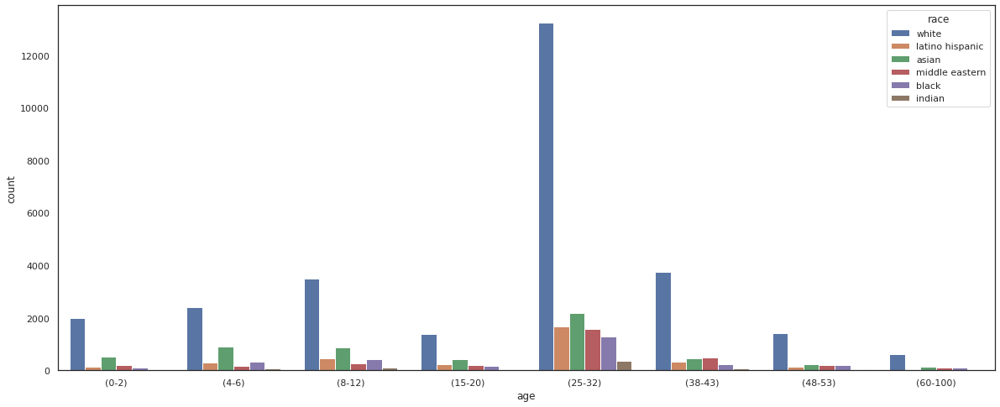

In [0]:
getGrouppedDistribution_of_dataset(fer_dataset) 

In [0]:
def getGrouppedDistribution_of_class(df, mask, title, desired_class):
  class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
  sns.set(style="white", palette="deep", color_codes=True)
  plt.figure(figsize = (20,8))

  ax = sns.countplot(x=df[mask]['age'], hue="gender", data=df,);
  for p in ax.patches:
          ax.annotate('{}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+10))
  plt.title(title + class_names[desired_class] + ' class')

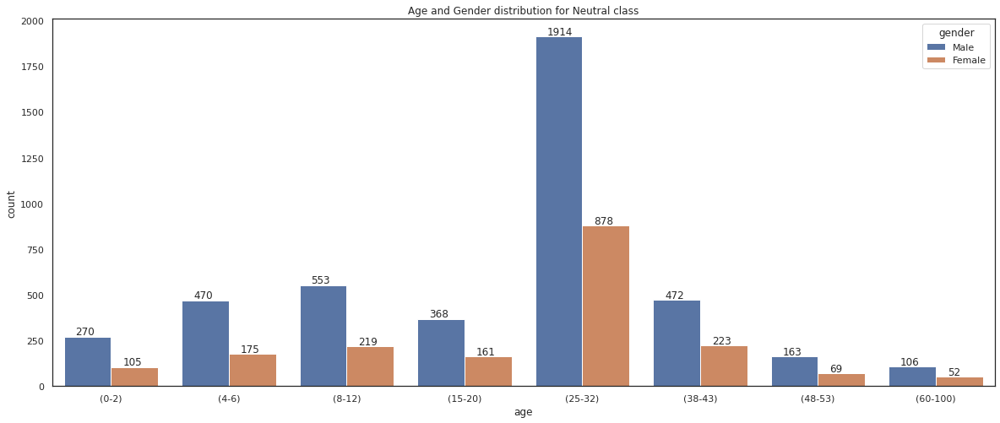

In [0]:
desired_class = 6
mask = (fer_dataset['emotion'] == desired_class) 
getGrouppedDistribution_of_class(fer_dataset,mask,'Age and Gender distribution for ', desired_class)  

In [0]:
# Get the distribution of a class regarding gender and age
def getDistribution_of_class(df,title, desired_class, desired_age):
  class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
  sns.set(style="white", palette="deep", color_codes=True)
  plt.figure(figsize = (10,8))

  ax = sns.countplot(x=df[(df['emotion'] == desired_class)]['gender'], hue="usage", data=df, palette=['red','green','blue']);
  for p in ax.patches:
    p.set_width(0.2)
    ax.annotate('{}'.format(p.get_height()), (p.get_x() + 0.03, p.get_height()),fontsize=15)
  plt.title(title + class_names[desired_class] + ' class for age between ' + desired_age)
  plt.savefig("/content/drive/My Drive/FaceX/in-depth analyse/"+desired_age+"/dist_"+desired_age+"_"+class_names[desired_class]+".png")
  plt.xticks(fontsize=14)

In [0]:
def getRaport(df,desired_class, desired_age):
  data = df.loc[(df['age'] == desired_age)].reset_index()
  getDistribution_of_class(data,'Distribution of class ',desired_class, desired_age)

In [0]:
fer_dataset = fer_dataset.sort_values(by=['usage','gender'], ignore_index=True)

In [0]:
def get_atomic_dist(df, class_list, age_list):
  for emotion in class_list:
    for age in age_list:
      desired_class = emotion
      desired_age = age
      getRaport(df,desired_class,desired_age)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


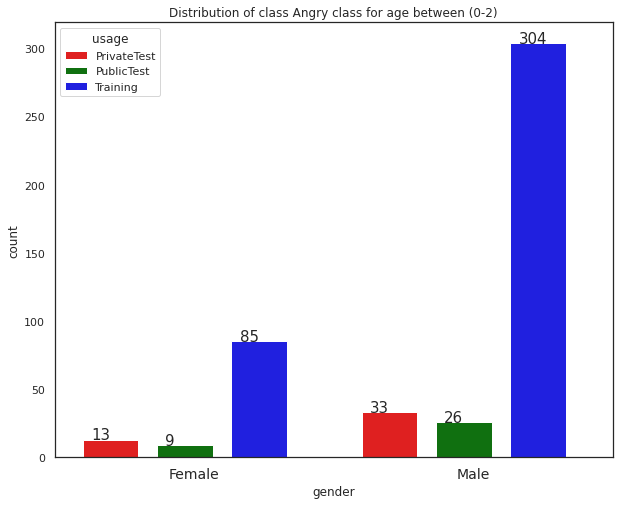

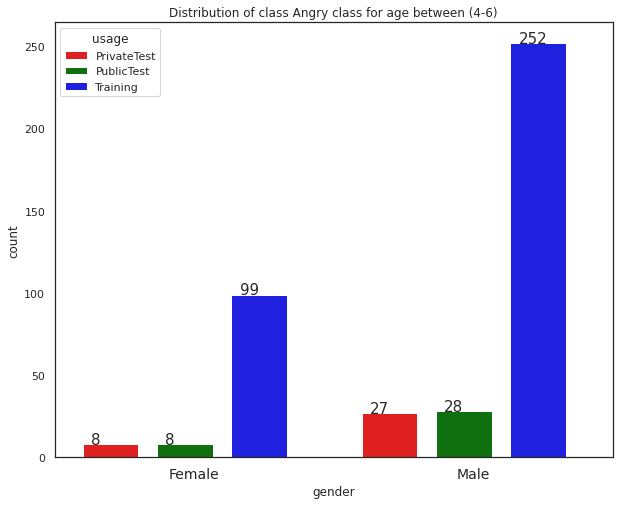

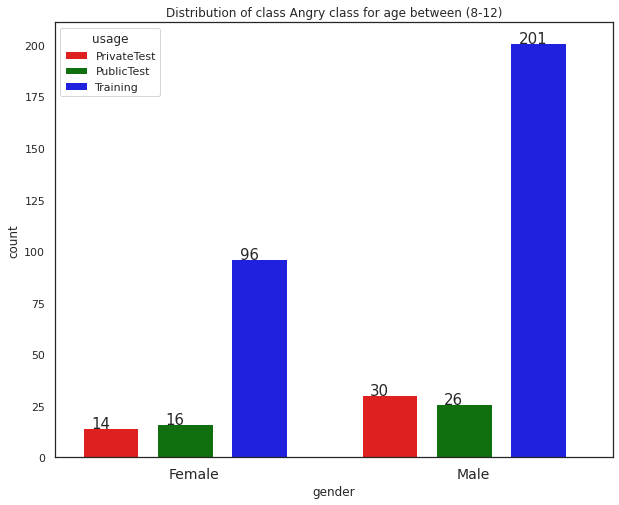

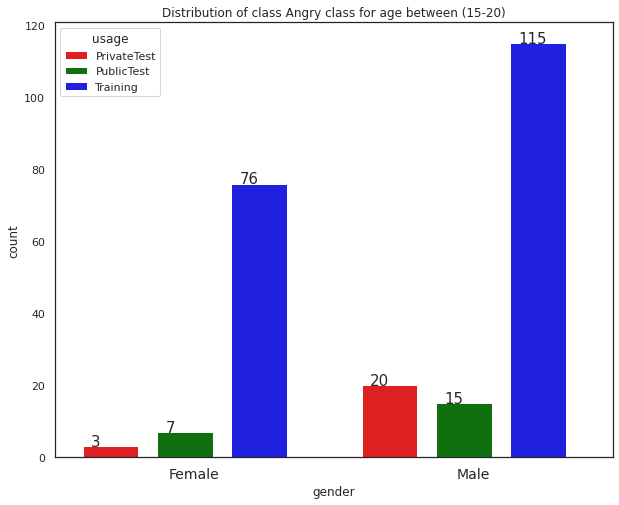

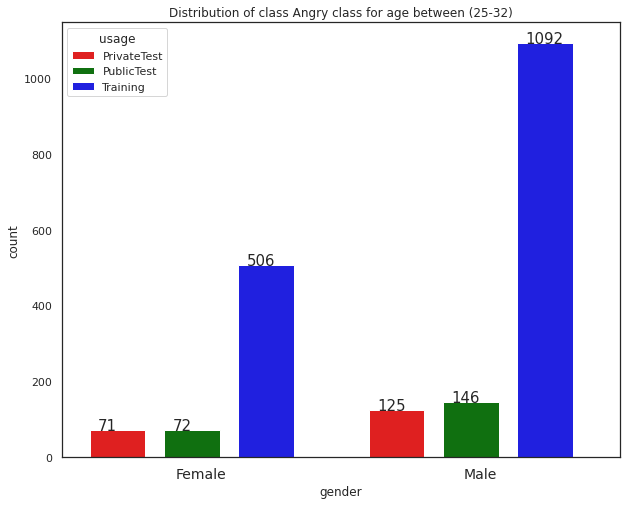

...

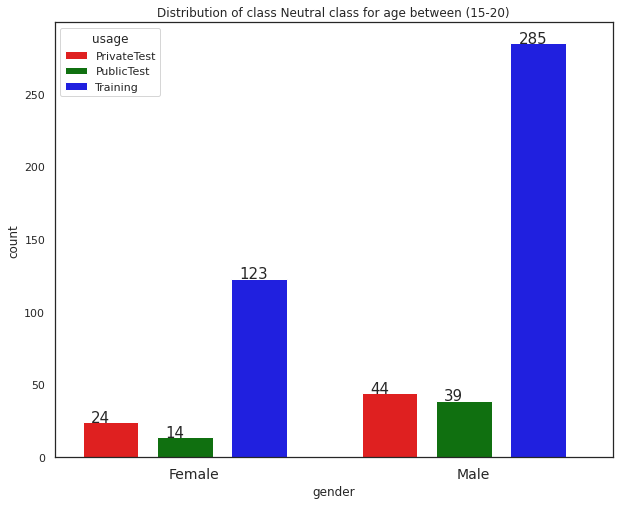

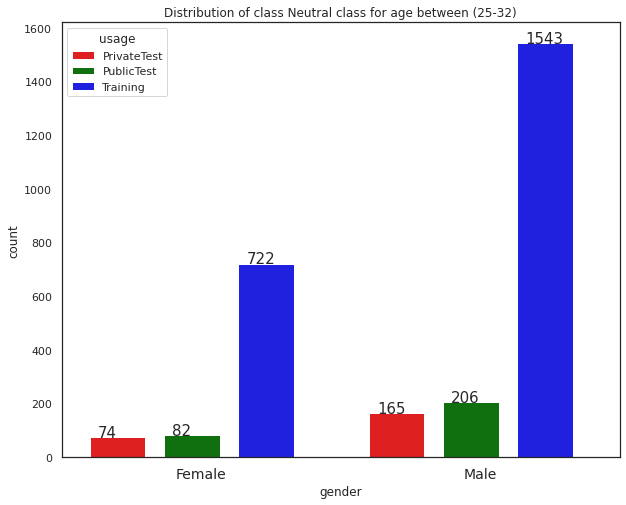

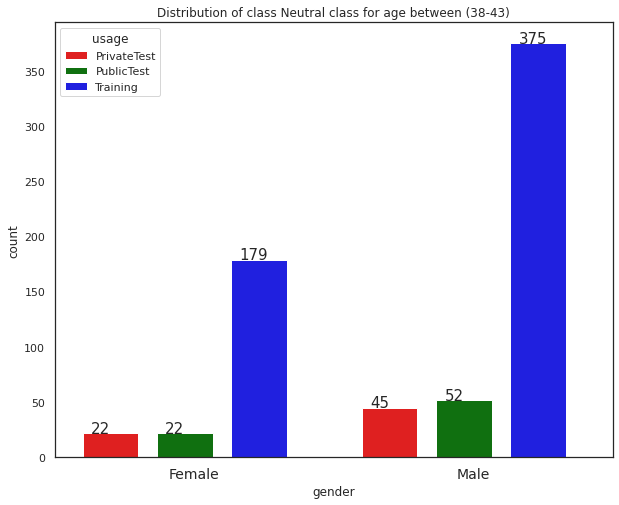

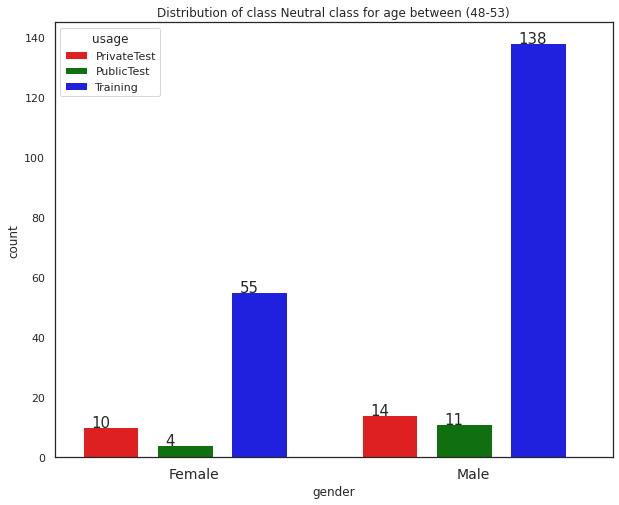

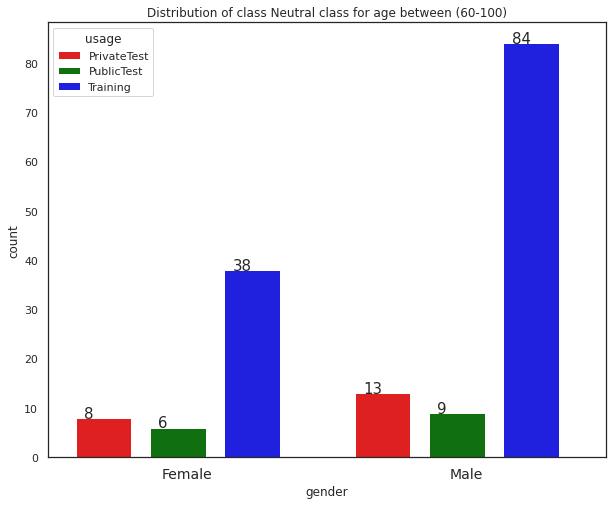

In [0]:
emotions = [0,1,2,3,4,5,6]
ageList=['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
get_atomic_dist(fer_dataset,emotions,ageList)

In [0]:
# Get the distribution of a class regarding gender and age
def getDistribution_of_age_on_emotions(df,title, desired_age):
  sns.set(style="white", palette="deep", color_codes=True)
  plt.figure(figsize = (20,8))

  ax = sns.countplot(x=df['usage'], hue="emotion", data=df, palette=sns.color_palette("Set2"));
  for p in ax.patches:
    p.set_width(0.1)
    ax.annotate('{}'.format(p.get_height()), (p.get_x() + 0.03, p.get_height()),fontsize=10)
  plt.title(title + desired_age)
  plt.xticks(fontsize=15)
  # plt.savefig("/content/drive/My Drive/FaceX/in-depth analyse/"+desired_age+"/dist_"+desired_age+".png")

In [0]:
def getRaport(df, desired_age):
  data = df.loc[(df['age'] == desired_age)].reset_index()
  getDistribution_of_age_on_emotions(data,'Emotion Distribution for people between ', desired_age)

In [0]:
fer_dataset = fer_dataset.sort_values(by=['emotion'], ignore_index=True)

In [0]:
emotions = {0:'Angry',1:'Disgust',2:'Fear',3:'Happy',4:'Sad',5:'Surprise',6:'Neutral'}
fer_dataset = fer_dataset.replace(emotions)

In [0]:
fer_dataset

,emotion,pixels,usage,age,gender,race
0,6,183 192 191 186 188 198 203 202 204 208 211 21...,Training,(4-6),Male,asian
1,white,122 122 108 118 144 146 131 120 110 131 116 12...,PrivateTest,(4-6),Female,asian
2,white,132 133 140 115 69 113 124 112 114 94 126 82 6...,Training,(25-32),Female,asian
3,white,213 156 101 84 62 49 54 52 36 53 75 72 51 47 4...,Training,(25-32),Female,asian
4,asian,232 232 232 232 230 229 209 192 183 163 178 20...,PrivateTest,(8-12),Female,asian
...,...,...,...,...,...,...
44144,middle eastern,99 93 93 97 98 99 103 106 112 119 124 120 158 ...,Training,(4-6),Male,latino hispanic
44145,latino hispanic,104 52 7 12 10 9 10 16 20 27 36 44 58 65 56 54...,Training,(38-43),Male,latino hispanic
44146,middle eastern,48 65 85 89 91 127 144 163 180 188 185 185 177...,Training,(8-12),Male,latino hispanic
44147,white,7 7 6 7 7 6 8 10 10 8 13 15 23 29 28 34 52 64 ...,Training,(25-32),Male,latino hispanic


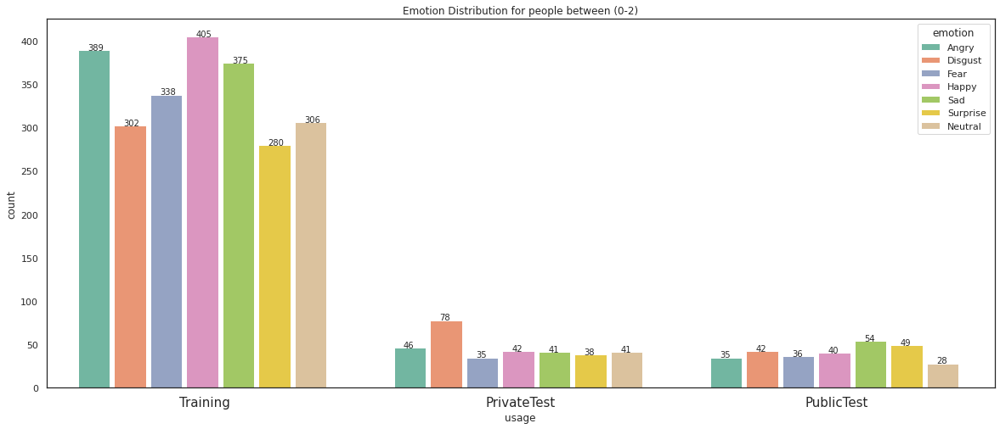

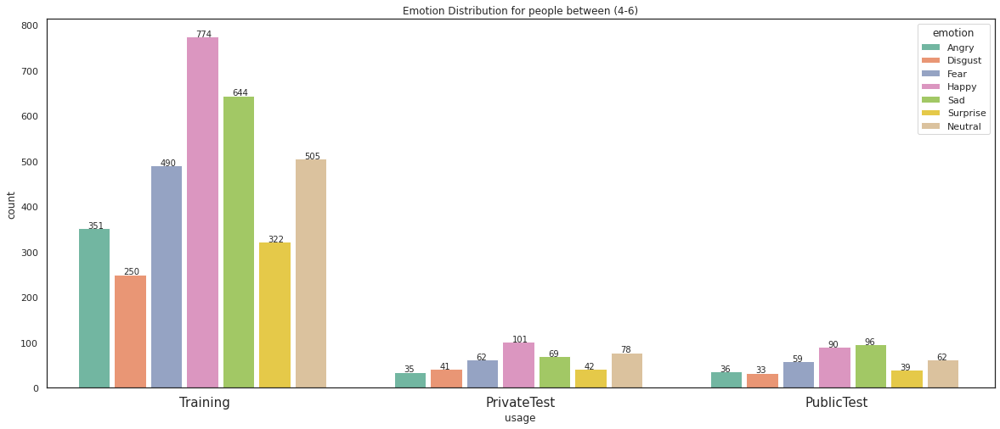

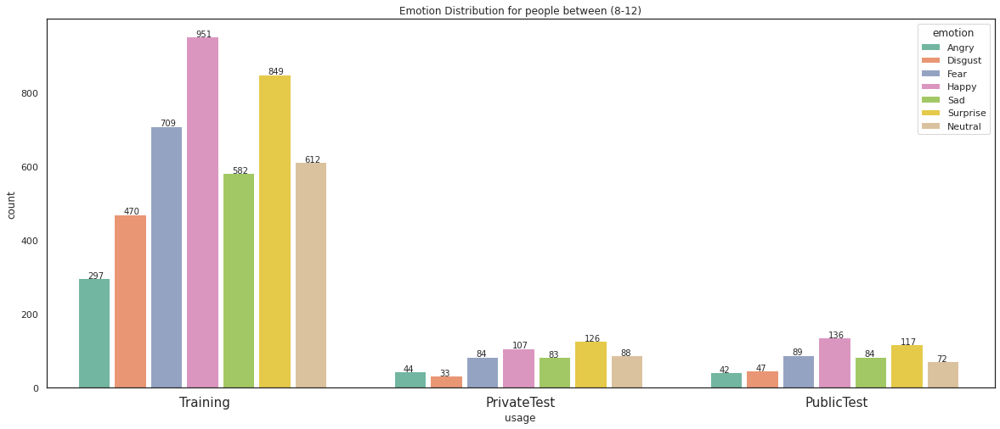

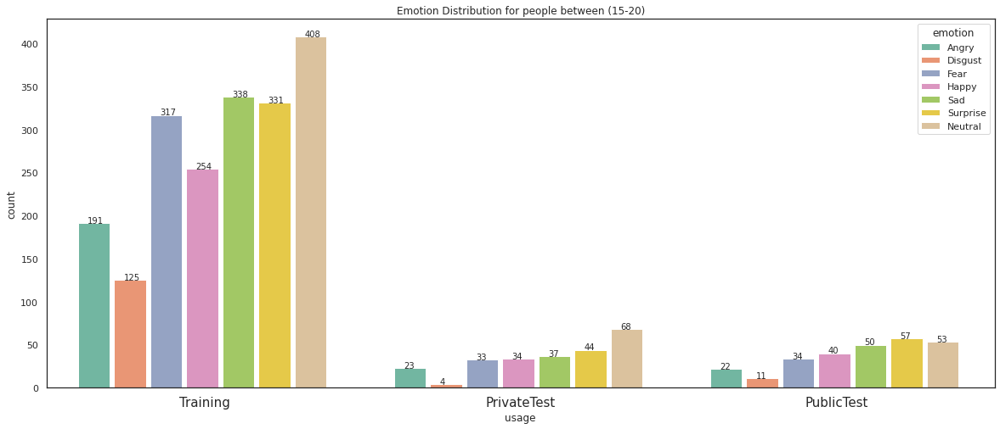

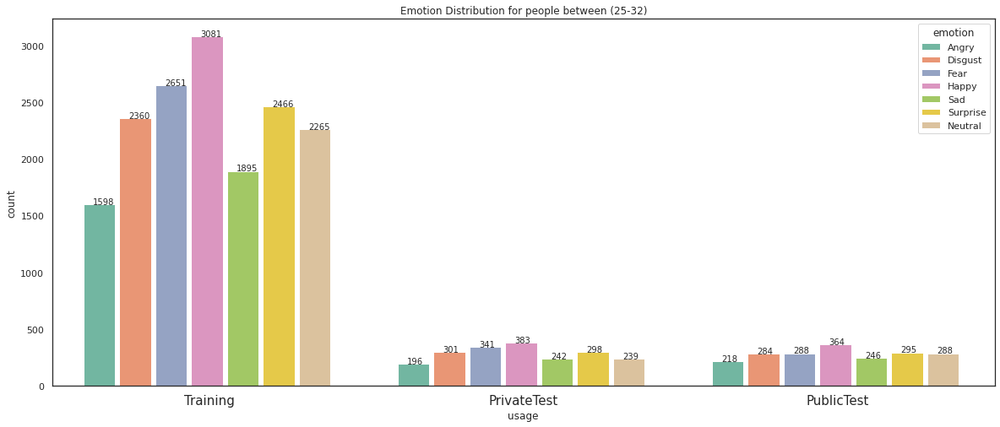

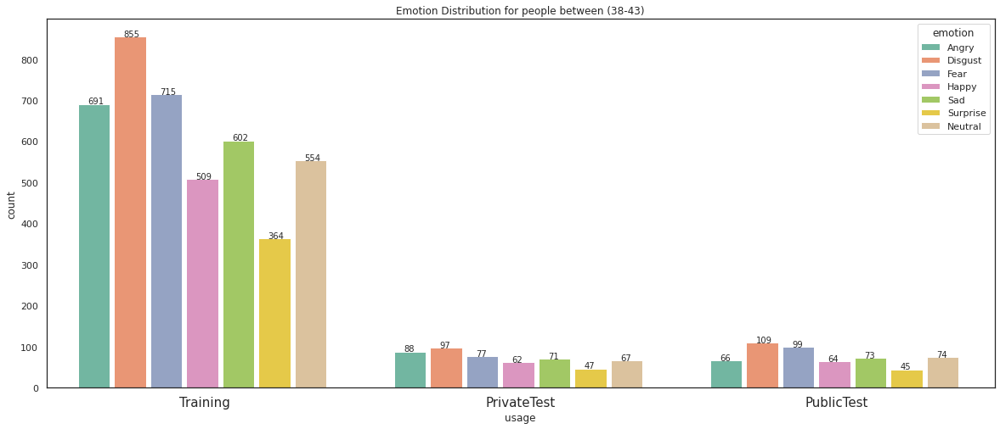

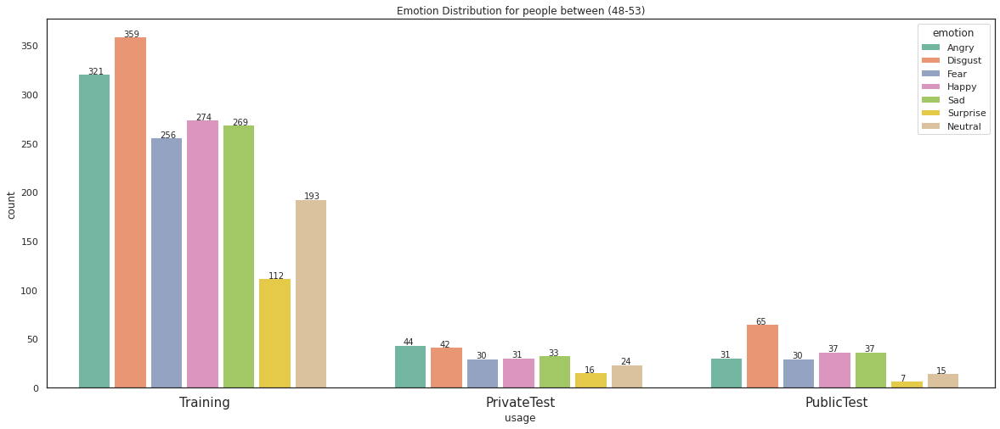

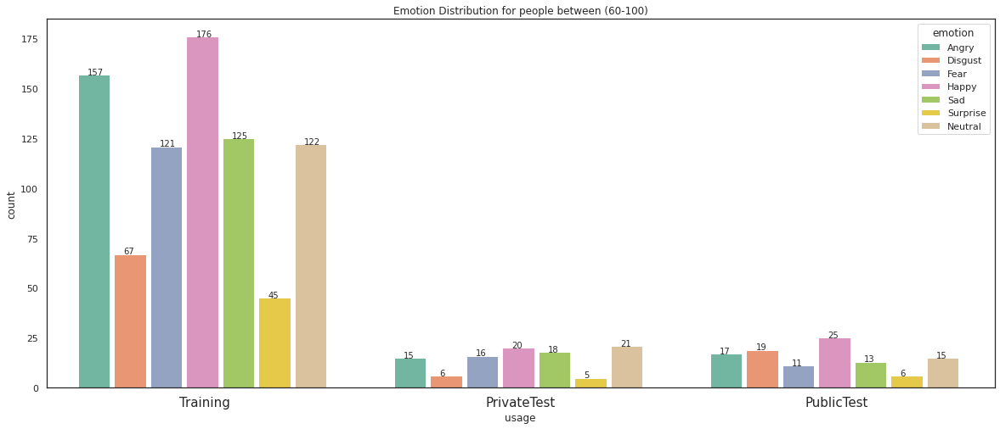

In [0]:
def getDistributions_on_sets(df,age_list):
  for age in age_list:
    desired_age = age
    getRaport(df,desired_age)

ageList=['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
getDistributions_on_sets(fer_dataset,ageList)

In [0]:
# Get the distribution of a class regarding gender and age
def getDistribution_of_age_on_race(df,title, desired_age):
  sns.set(style="white", palette="deep", color_codes=True)
  plt.figure(figsize = (20,8))

  ax = sns.countplot(x=df['usage'], hue="race", data=df, palette=sns.color_palette("Set2"));
  for p in ax.patches:
    p.set_width(0.1)
    ax.annotate('{}'.format(p.get_height()), (p.get_x() + 0.03, p.get_height()),fontsize=10)
  plt.title(title + desired_age)
  plt.xticks(fontsize=15)
  # plt.savefig("/content/drive/My Drive/FaceX/in-depth analyse/"+desired_age+"/dist_"+desired_age+".png")

In [0]:
def getRaport(df, desired_age):
  data = df.loc[(df['age'] == desired_age)].reset_index()
  getDistribution_of_age_on_race(data,'Race Distribution for people between ', desired_age)

In [0]:
fer_dataset = fer_dataset.sort_values(by=['race'], ignore_index=True)

In [0]:
races = fer_dataset['race'].unique()

In [0]:
races

array([0, 1, 2, 3, 4, 5])

In [0]:
# emotions = {0:'Angry',1:'Disgust',2:'Fear',3:'Happy',4:'Sad',5:'Surprise',6:'Neutral'}
race_labels = {0:'asian', 1:'indian', 2:'black', 3:'white', 4:'middle eastern', 5:'latino hispanic'}
fer_dataset = fer_dataset.drop(['emotion'],axis=1)
fer_dataset = fer_dataset.replace(race_labels)

In [0]:
fer_dataset

,pixels,usage,age,gender,race
0,183 192 191 186 188 198 203 202 204 208 211 21...,Training,(4-6),Male,asian
1,122 122 108 118 144 146 131 120 110 131 116 12...,PrivateTest,(4-6),Female,asian
2,132 133 140 115 69 113 124 112 114 94 126 82 6...,Training,(25-32),Female,asian
3,213 156 101 84 62 49 54 52 36 53 75 72 51 47 4...,Training,(25-32),Female,asian
4,232 232 232 232 230 229 209 192 183 163 178 20...,PrivateTest,(8-12),Female,asian
...,...,...,...,...,...
44144,99 93 93 97 98 99 103 106 112 119 124 120 158 ...,Training,(4-6),Male,latino hispanic
44145,104 52 7 12 10 9 10 16 20 27 36 44 58 65 56 54...,Training,(38-43),Male,latino hispanic
44146,48 65 85 89 91 127 144 163 180 188 185 185 177...,Training,(8-12),Male,latino hispanic
44147,7 7 6 7 7 6 8 10 10 8 13 15 23 29 28 34 52 64 ...,Training,(25-32),Male,latino hispanic


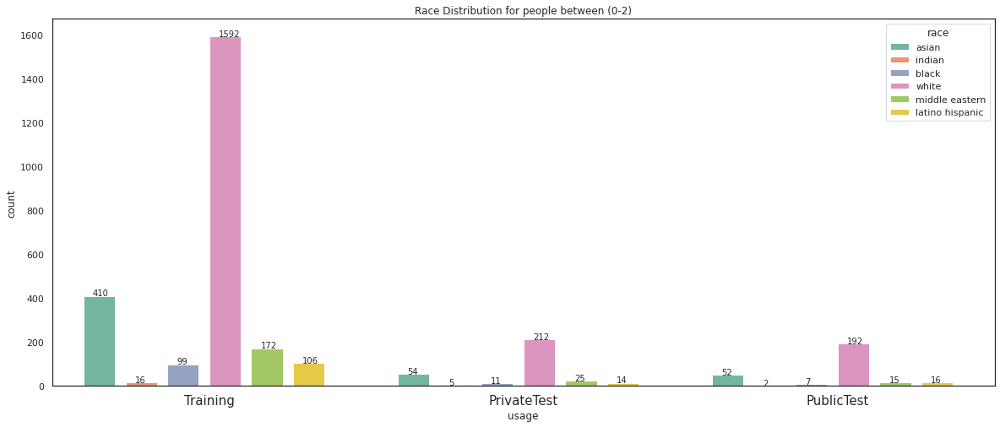

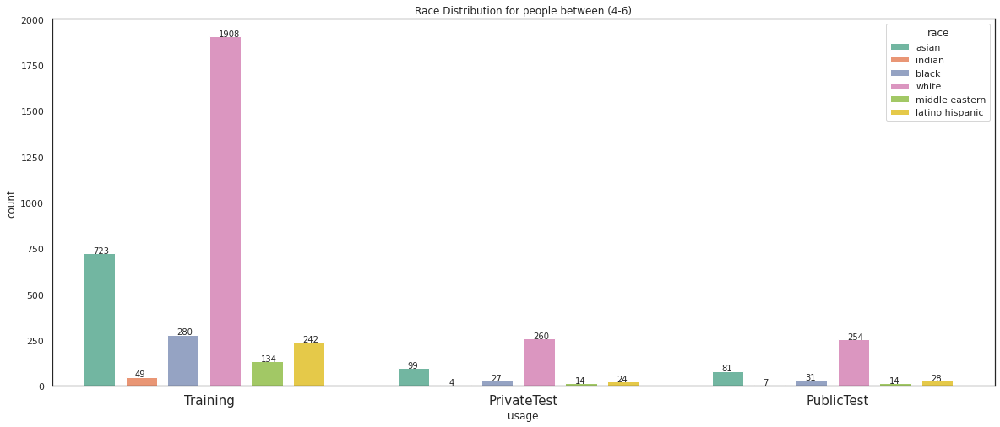

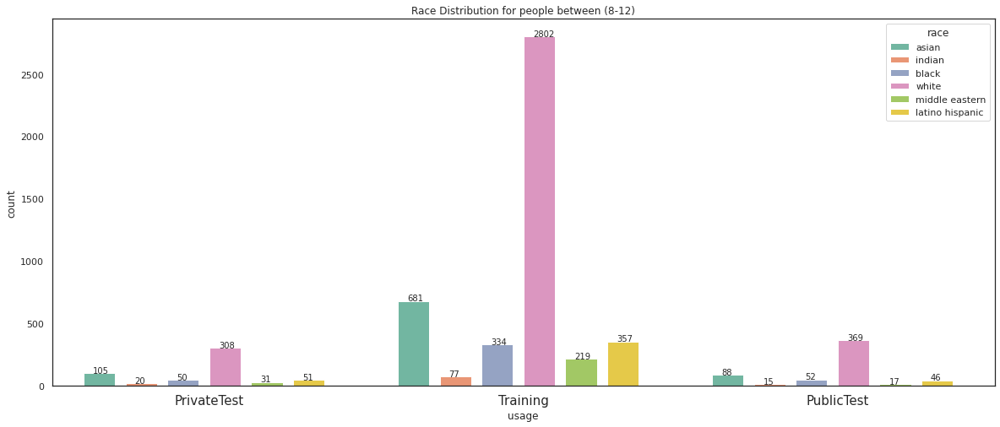

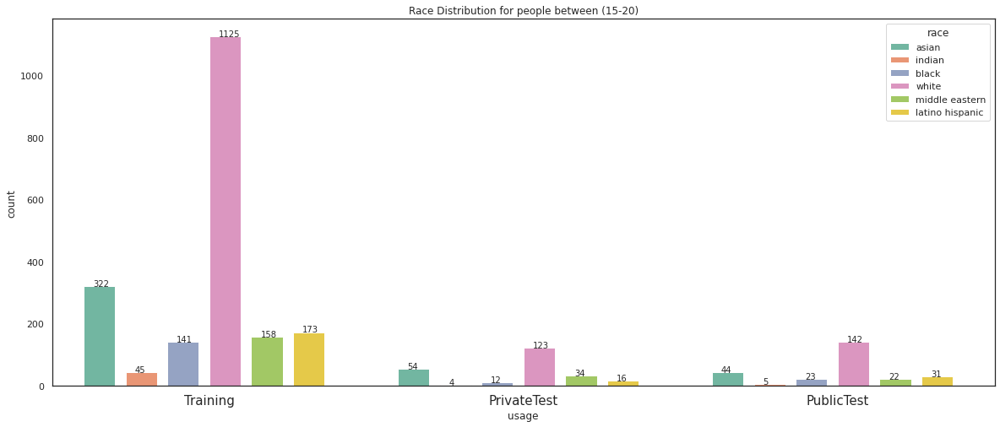

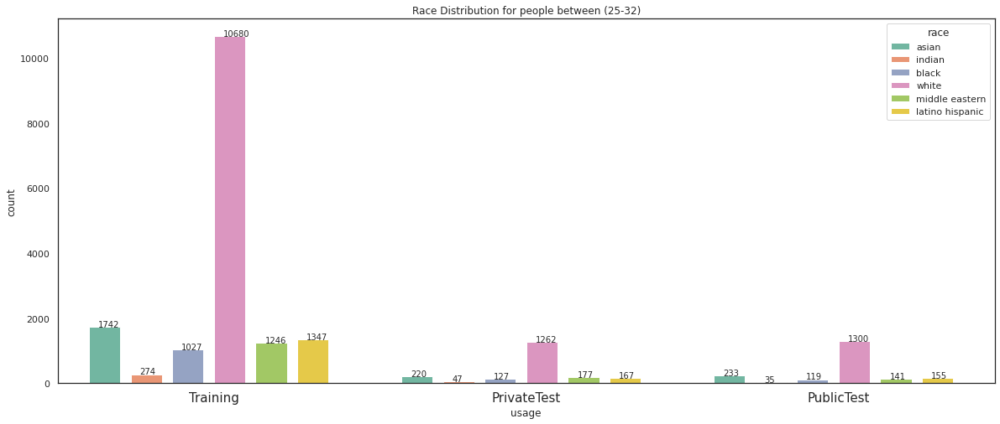

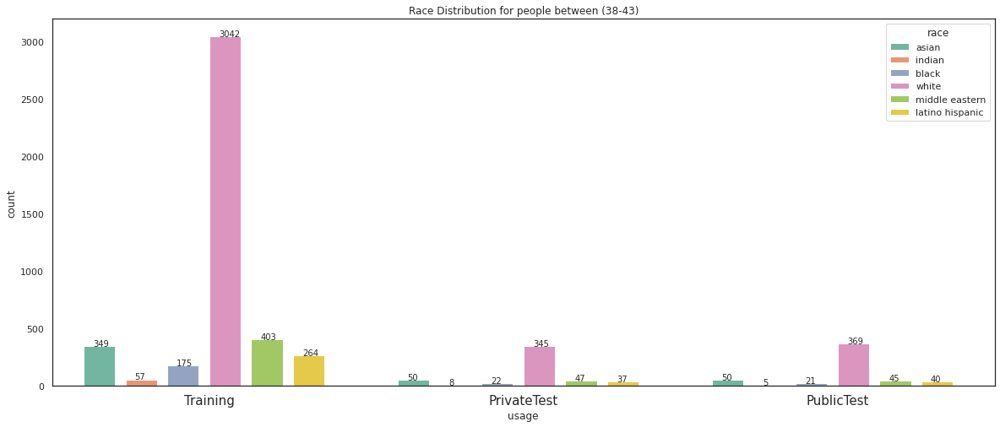

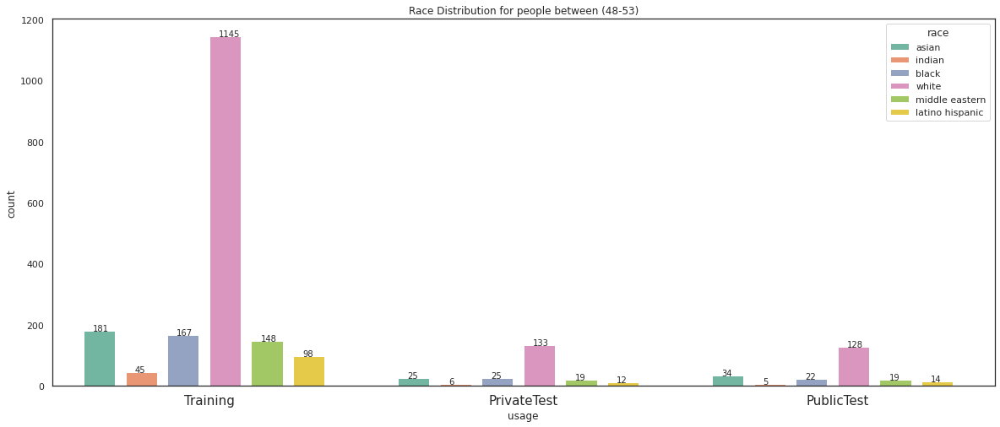

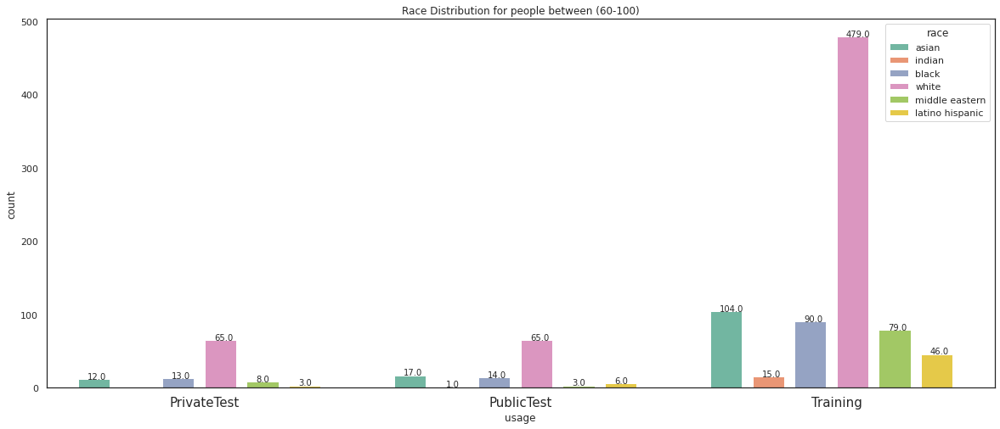

In [0]:
def getDistributions_on_sets(df,age_list):
  for age in age_list:
    desired_age = age
    getRaport(df,desired_age)

ageList=['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
getDistributions_on_sets(fer_dataset,ageList)

In [0]:
def getGrouppedDistribution_of_class_on_race(df, mask, title, desired_class):
  class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
  sns.set(style="white", palette="deep", color_codes=True)
  plt.figure(figsize = (30,8))

  ax = sns.countplot(x=df[mask]['age'], hue="race", data=df,);
  for p in ax.patches:
    p.set_width(0.1)
    ax.annotate('{}'.format(p.get_height()), (p.get_x(), p.get_height()+10))
  plt.title(title + class_names[desired_class] + ' class')
  plt.savefig("/content/drive/My Drive/FaceX/in-depth analyse/race & emotion/"+class_names[desired_class]+"/dist_"+class_names[desired_class]+".png")

In [0]:
def getGrouppedDistribution_of_class_on_race(df, mask, title, desired_class, desired_age):
  class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
  sns.set(style="white", palette="deep", color_codes=True)
  plt.figure(figsize = (25,8))

  ax = sns.countplot(x=df[mask]['usage'], hue="race", data=df,);
  for p in ax.patches:
    p.set_width(0.1)
    ax.annotate('{}'.format(p.get_height()), (p.get_x(), p.get_height()),fontsize=10)
    ax.legend(loc="upper right")
  plt.title(title + class_names[desired_class] + ' class and ' + desired_age + ' age interval')
  plt.savefig("/content/drive/My Drive/FaceX/in-depth analyse/race & emotion/"+class_names[desired_class]+"/dist_"+class_names[desired_class]+"_on_age_"+desired_age+".png")

In [0]:
concatenated_dataset = concatenated_dataset.sort_values(by='usage', ascending=False)

In [0]:
def getGrouppedDistribution_overall_on_race(df):
  sns.set(style="white", palette="deep", color_codes=True)
  plt.figure(figsize = (25,8))

  ax = sns.countplot(x=df['usage'], hue="race", data=df,);
  for p in ax.patches:
    p.set_width(0.1)
    ax.annotate('{}'.format(p.get_height()), (p.get_x(), p.get_height()),fontsize=10)
    ax.legend(loc="upper right")
  plt.savefig("/content/overall-on-sets-on-race.png", dpi = 500)

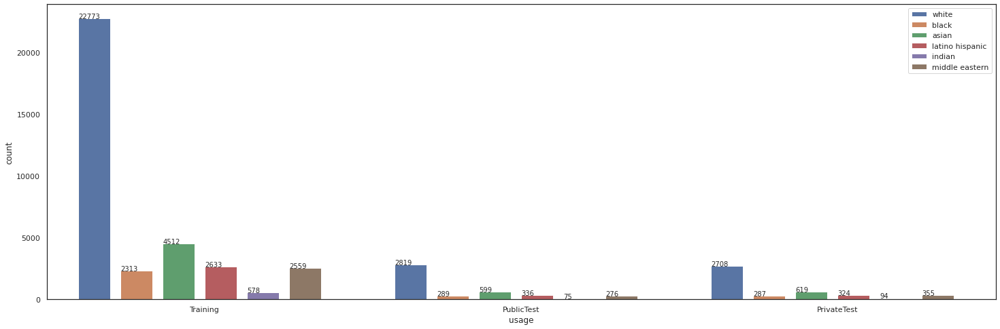

In [24]:
getGrouppedDistribution_overall_on_race(concatenated_dataset)

In [0]:
fer_dataset_emotion_only = fer_dataset.drop(['pixels','usage','age','gender','race'],axis=1)

In [0]:
race_labels = {0:'asian', 1:'indian', 2:'black', 3:'white', 4:'middle eastern', 5:'latino hispanic'}
fer_dataset = fer_dataset.drop(['emotion'],axis=1)
fer_dataset = fer_dataset.replace(race_labels)

In [0]:
concatenated_dataset = pd.concat([fer_dataset,fer_dataset_emotion_only],ignore_index=True,axis=1,)

In [0]:
concatenated_dataset = concatenated_dataset.rename(columns={0:"pixels",1:"usage",2:"age",3:"gender",4:"race",5:"emotion"})

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


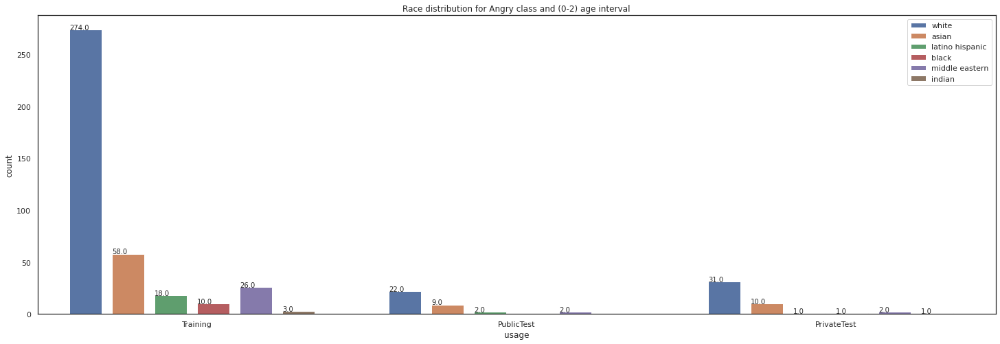

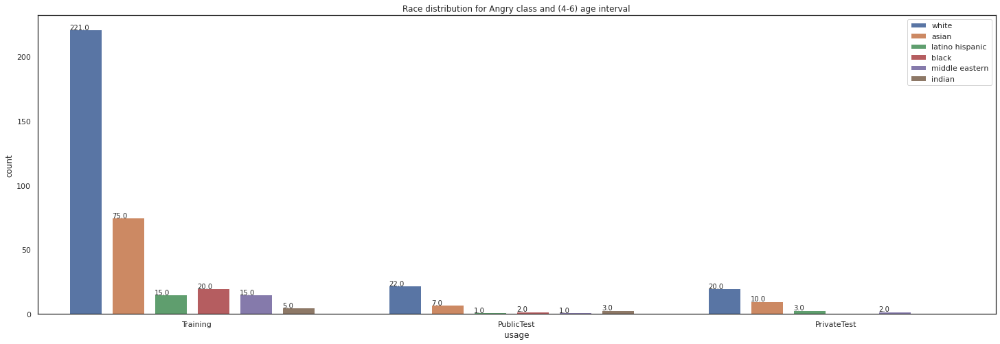

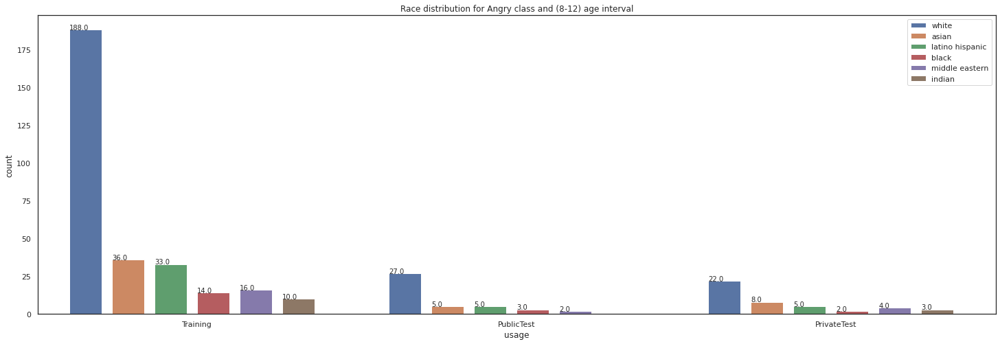

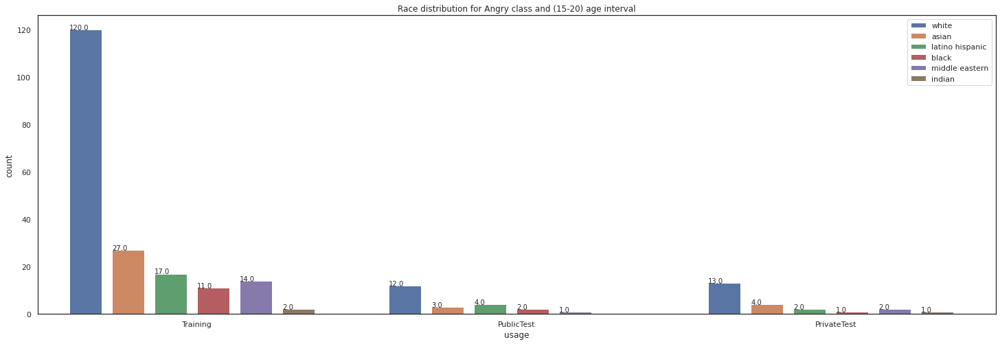

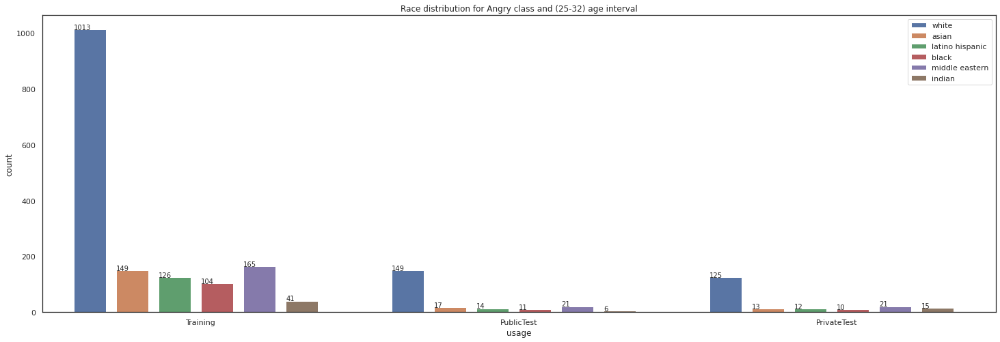

...

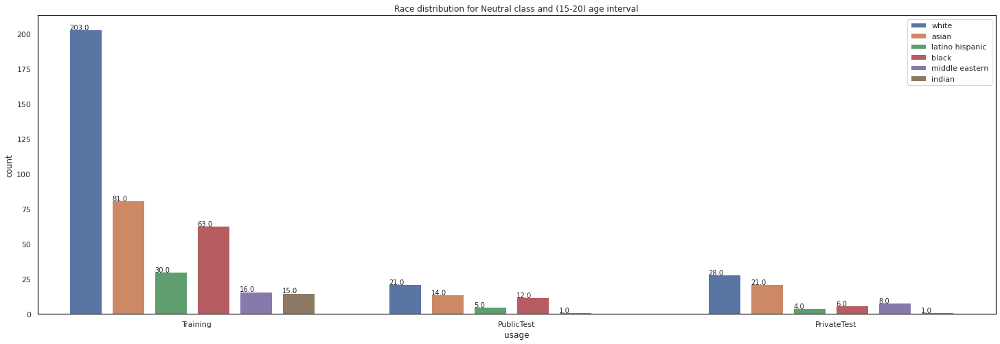

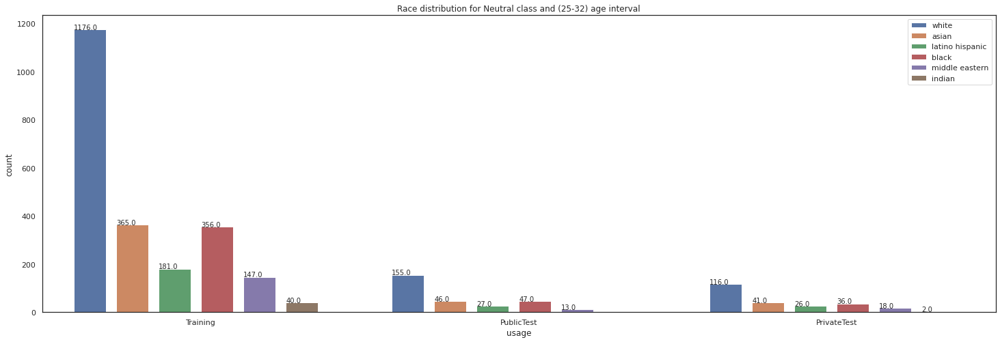

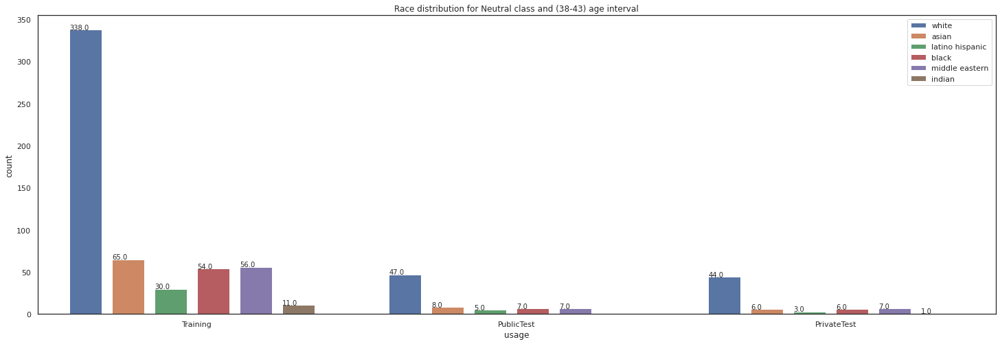

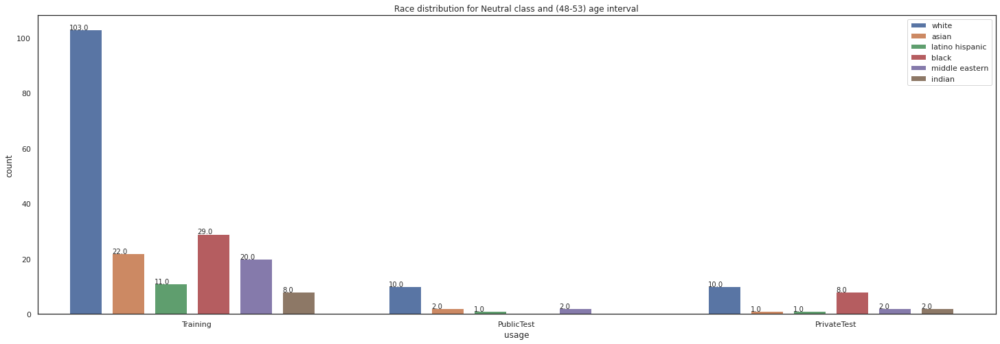

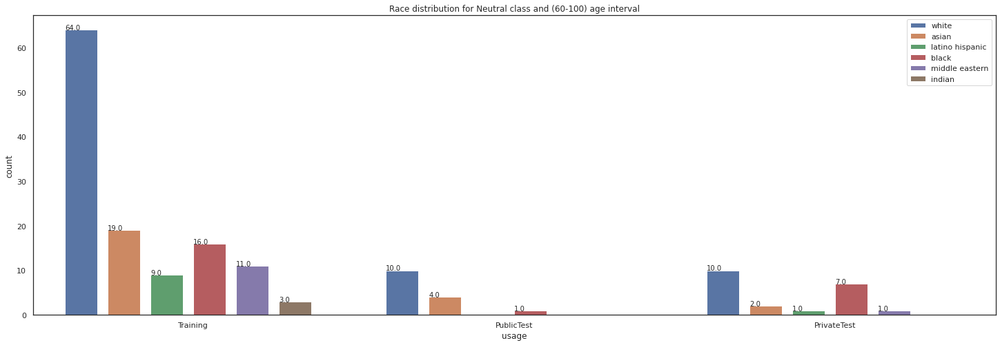

In [0]:
def getDist(df,classes, ageList):
  for classs in classes:
    desired_class = classs
    for age in ageList:
      desired_age = age
      mask = ((concatenated_dataset['emotion'] == desired_class) & (concatenated_dataset['age'] == desired_age))
      getGrouppedDistribution_of_class_on_race(df,mask,'Race distribution for ', desired_class, desired_age)  

clss = [0,1,2,3,4,5,6]
ageList=['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
getDist(concatenated_dataset, clss, ageList)

In [0]:
class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
sns.set(style="white", palette="deep", color_codes=True)
plt.figure(figsize = (25,8))

ax = sns.countplot(x=df[mask]['age'], hue="race", data=df,);
for p in ax.patches:
        ax.annotate('{}'.format(p.get_height()), (p.get_x(), p.get_height()+10))
plt.title(title + class_names[desired_class] + ' class')

In [0]:
# Get the distribution of a class regarding gender and age
def getDistribution_of_class(df,title, desired_class, desired_age):
  class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
  sns.set(style="white", palette="deep", color_codes=True)
  plt.figure(figsize = (10,8))

  ax = sns.countplot(x=df[(df['emotion'] == desired_class)]['gender'], hue="usage", data=df, palette=['red','green','blue']);
  for p in ax.patches:
    p.set_width(0.2)
    ax.annotate('{}'.format(p.get_height()), (p.get_x() + 0.03, p.get_height()),fontsize=15)
  plt.title(title + class_names[desired_class] + ' class for age between ' + desired_age)
  plt.savefig("/content/drive/My Drive/FaceX/in-depth analyse/"+desired_age+"/dist_"+desired_age+"_"+class_names[desired_class]+".png")
  plt.xticks(fontsize=14)

In [0]:
def getRaport(df,desired_class, desired_age):
  data = df.loc[(df['age'] == desired_age)].reset_index()
  getDistribution_of_class(data,'Distribution of class ',desired_class, desired_age)

In [0]:
fer_dataset = fer_dataset.sort_values(by=['usage','gender'], ignore_index=True)

# **Calculate how many false negatives have the model on people of each age segment on each class**

In [0]:
path_to_dataset = '/content/drive/My Drive/datasets/facial-expression/fer2013/fer2013_gender_age_race.csv'
fer_dataset = pd.read_csv(path_to_dataset)

In [0]:
fer_dataset

,emotion,pixels,usage,age,gender,race
0,0,70 80 82 72 58 58 60 63 54 58 60 48 89 115 121...,Training,(38-43),Male,3
1,0,151 150 147 155 148 133 111 140 170 174 182 15...,Training,(25-32),Female,0
2,2,231 212 156 164 174 138 161 173 182 200 106 38...,Training,(15-20),Female,3
3,4,24 32 36 30 32 23 19 20 30 41 21 22 32 34 21 1...,Training,(25-32),Male,3
4,6,4 0 0 0 0 0 0 0 0 0 0 0 3 15 23 28 48 50 58 84...,Training,(15-20),Male,5
...,...,...,...,...,...,...
44144,5,255 255 255 253 254 250 234 98 47 47 26 18 12 ...,PrivateTest,(25-32),Female,5
44145,5,195 210 218 245 254 252 255 241 115 73 97 150 ...,PrivateTest,(25-32),Female,3
44146,5,222 228 219 222 232 229 184 116 96 107 81 52 5...,PrivateTest,(15-20),Female,3
44147,5,192 184 166 158 150 148 144 143 142 138 135 13...,PrivateTest,(25-32),Female,3


In [0]:
# Function for normalizing the dataset
# input_set: dataset 
# scaler: the scaler for normalize
# @return: dataset with normalized data
def normalizeSet(input_set, scaler):
  x = scaler.fit_transform(input_set)
  return x

# The function for getting the pixels as a list 
# input_set: dataset 
# @return: an array of flattened images
def getPixels(input_set):
  pixels = input_set['pixels'].tolist()
  new_pixels = []
  for pixel_sequence in pixels:
    image = [int(pixel) for pixel in pixel_sequence.split(' ')]
    new_pixels.append(image)
  return np.asarray(new_pixels, dtype='float32')  

# The function for reshpping the dataset
# cutsize: if True the image will be cutted
# input_set: dataset with only pixels (# the return of the getPixels(input_set))
def reshapeDataset(input_set, cutsize=False):
  new_input_set = []
  for image in input_set:
    # reshape the image in (48, 48) shape
    image = image.reshape((48, 48))
    
    # # resize the image in (44, 44) shape
    # if cutsize:
    #   image = cv2.resize(image,(44, 44))

    # add new axis for being in (48, 48, 1) shape
    image = image[:, :, np.newaxis]

    # reshape in (48, 48, 3) shape by concatenating 3 times the image
    # image = np.concatenate((image, image, image), axis=2)
    new_input_set.append(image)
  return np.asarray(new_input_set, dtype='float32')

# This function is going to help with normalizing and reshapping a set
def normalize_reshape_set(input_set, scaler, cutsize):
  images = getPixels(input_set)

  images = normalizeSet(images,scaler)

  reshapped_images = reshapeDataset(images,cutsize)

  return reshapped_images

In [0]:
from sklearn.preprocessing import MinMaxScaler
def splitdataset(dataset):
  # We want to preparing the data set for normalizing part

  # 1. Split the data frame for training, data for validation,data for testing
  data_for_training = dataset[dataset['usage'] == 'Training']

  data_for_validation = dataset[dataset['usage'] == 'PublicTest']
  data_for_testing = dataset[dataset['usage'] == 'PrivateTest']

  # 2. Drop the column usage, age, gender from train, validation and test sets
  data_for_training = data_for_training.drop(['usage'],axis=1)
  data_for_validation = data_for_validation.drop(['usage'],axis=1)
  data_for_testing = data_for_testing.drop(['usage'],axis=1)

  data_for_training = data_for_training.drop(['age'],axis=1)
  data_for_validation = data_for_validation.drop(['age'],axis=1)
  data_for_testing = data_for_testing.drop(['age'],axis=1)

  data_for_training = data_for_training.drop(['gender'],axis=1)
  data_for_validation = data_for_validation.drop(['gender'],axis=1)
  data_for_testing = data_for_testing.drop(['gender'],axis=1)

  # 3. Split the data in X and y format; 
  #    X stands for the column 'pixels' from original dataframe and y stands for column 'emotion' from original dataset
  #    The partitioning will be: X_train, y_train, X_validation, y_validation, X_test, y_test

  scaler = MinMaxScaler()
  if (data_for_training.shape[0] > 0):
    X_train = normalize_reshape_set(data_for_training, scaler, cutsize = False)
    y_train = np.asarray(data_for_training['emotion'], dtype='int32')
  else:
    X_train = np.asarray([])
    y_train = np.asarray([])

  if (data_for_validation.shape[0] > 0):
    X_val = normalize_reshape_set(data_for_validation, scaler, cutsize = True)
    y_val = np.asarray(data_for_validation['emotion'], dtype='int32')
  else:
    X_val = np.asarray([])
    y_val = np.asarray([])

  if (data_for_testing.shape[0] > 0):
    X_test = normalize_reshape_set(data_for_testing, scaler, cutsize = True)
    y_test = np.asarray(data_for_testing['emotion'], dtype='int32')
  else:
    X_test = np.asarray([])
    y_test = np.asarray([])

  return (X_train,X_val,X_test,y_train,y_val,y_test)

In [0]:
number_classes = 7
number_features = 32
growthRate = 8

verbosity = 1

loss_function = 'sparse_categorical_crossentropy'

initial_learning_rate = 0.01
batch_size = 64
lambd = 0.0005
regularizer = tf.keras.regularizers.l1(lambd)

In [0]:
# Let's make the EdgeCNN arhictecture based on DenseNet, but with some additional changes in order to work well on Raspberry Pi 4
from tensorflow.keras import layers, models, Model

# Create the function for Edge convolution block
# x: input layer 
# growthRate: how many filter we want fot output
# @return: the layer after applying convolution block 1 and 2
def EdgeBlock(x, growthRate, name):
  # Convolution block 1
  x = layers.Conv2D(4 * growthRate, kernel_size = 3, kernel_regularizer = regularizer,padding = 'same', name='conv1_dense' + name)(x)
  x = layers.BatchNormalization(name='batchnorm1_dense' + name)(x)
  x = layers.ReLU(name='relu_dense'+name)(x)

  # Convolution block 2
  x = layers.Conv2D(1 * growthRate, kernel_size = 3, kernel_regularizer = regularizer, padding = 'same', name='conv2_dense' + name)(x)
  x = layers.BatchNormalization(name='batchnorm2_dense' + name)(x)
  return x

# Create the function for Dense Block
# input_layer: the layer on which we apply the EdgeBlock function of 'repetition' times 
# growthRate: how many filter we want for output
# name: name of the denseblock densenumber_
# @return: concatenated layers after applying the EdgeBlock of 'repetition' times
def denseBlock(input_layer, repetition, growthRate, name):
  for i in range(repetition):
    # apply the convolution block 1 and 2
    x = EdgeBlock(input_layer, growthRate,str(name)+'_'+str(i))
    # concatenate with the input layer
    input_layer = layers.Concatenate()([input_layer,x])
  return input_layer

# Create the transition layer
# input_layer: the layer on which we apply average pooling
# name: name of the layer
# @return: the layer with average pooling applied
def transitionLayer(input_layer, name):
  input_layer = layers.AveragePooling2D((2,2), strides = 2, name = 'transition_'+str(name))(input_layer)
  return input_layer

input_shape = (48,48,1)
input_net = layers.Input(input_shape)
# First layer of convolution
x = layers.Conv2D(number_features,(3,3), kernel_regularizer = regularizer,padding = 'same', use_bias = True, strides = 1, name='conv0')(input_net)
x = layers.MaxPool2D((3,3),padding = 'same',strides = 2, name='pool0')(x)

# Add the Dense layers
repetitions = 4, 4, 7

layer_index = 1
for repetition in repetitions:
  dense_block = denseBlock(x, repetition, growthRate,name=layer_index)
  x = transitionLayer(dense_block, name=layer_index)
  layer_index+=1

x = layers.GlobalAveragePooling2D(data_format='channels_last')(dense_block)

output_layer = layers.Dense(number_classes, activation='softmax', kernel_regularizer = regularizer)(x)
EdgeCNN_sgd_optimizer = Model(input_net, output_layer)

In [0]:
# SGD OPTIMIZER
sgd_optimizer = tf.optimizers.SGD(learning_rate=initial_learning_rate,  momentum=0.9)

# SGD optimizer
EdgeCNN_sgd_optimizer.compile(
    optimizer = sgd_optimizer,
    loss = loss_function,
    metrics = ['accuracy']
)


In [0]:
# NU UITA SA DAI COMPILE DIN NOU
EdgeCNN_sgd_optimizer.load_weights('/content/drive/My Drive/FaceX/tests/ReduceLROnPlateau/v0.0.1/weights-improvement-319-0.66.hdf5')

In [0]:
# def getPerformanceFor_Emotion_Age(df,model,mask, pathToCSV,age, emotion):
#   class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
#   filtered_df = df[mask]
#   X_train,X_val,X_test,y_train,y_val,y_test =splitdataset(filtered_df)
#   loss, acc = model.evaluate(X_test,  y_test,batch_size=batch_size, verbose=0)
#   train_images = X_train.shape[0]
#   val_images = X_val.shape[0]
#   test_images = X_test.shape[0]
#   support = train_images + val_images + test_images
#   print("-------------------------------------------------------------------------------------------------------------------------")
#   print("On emotion " + class_names[emotion] + " and age " + age + " the recall was " + str(acc))
#   print("Number of train images: " + str(train_images))
#   print("Number of validation images: " + str(val_images))
#   print("Number of test images: " + str(test_images))
#   print("Number of total images: " + str(support))
#   print("-------------------------------------------------------------------------------------------------------------------------")
#   # Write to csv the image with the label 
#   with open(pathToCSV, mode='a') as images_file:
#     images_writer = csv.writer(images_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
#     images_writer.writerow([class_names[emotion], age, acc, train_images,val_images,test_images,support])

In [0]:
# def getPerformance(df,model,pathToCSV, classes, ageList):
#   for classs in classes:
#     desired_class = classs
#     for age in ageList:
#       desired_age = age
#       mask = ((df['emotion'] == desired_class) & (df['age'] == desired_age))
#       getPerformanceFor_Emotion_Age(df,model,mask, pathToCSV, desired_age, desired_class) 

# clss = [0,1,2,3,4,5,6]
# pathToCSV = '/content/drive/My Drive/FaceX/model inference analysis/emotion_age_model_performance.csv'
# ageList=['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
# getPerformance(fer_dataset, EdgeCNN_sgd_optimizer,pathToCSV,clss, ageList)

-------------------------------------------------------------------------------------------------------------------------
On emotion Angry and age (0-2) the recall was 0.6086956262588501
Number of train images: 389
Number of validation images: 35
Number of test images: 46
Number of total images: 470
-------------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------------------
On emotion Angry and age (4-6) the recall was 0.4000000059604645
Number of train images: 351
Number of validation images: 36
Number of test images: 35
Number of total images: 422
-------------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------------------
On emotion Angry and age (8-12) 

In [0]:
# def getPerformanceFor_Emotion_Age_Race(df,model,mask, pathToCSV,age, emotion,race_index):
#   class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
#   race_labels = ['asian', 'indian', 'black', 'white', 'middle eastern', 'latino hispanic']

#   filtered_df = df[mask]

#   X_train,X_val,X_test,y_train,y_val,y_test =splitdataset(filtered_df)

#   train_images = X_train.shape[0]
#   val_images = X_val.shape[0]
#   test_images = X_test.shape[0]
#   if(test_images > 0):
#     loss, acc = model.evaluate(X_test,  y_test,batch_size=batch_size, verbose=0)
#   else:
#     acc = 0.0
#   support = train_images + val_images + test_images
#   print("-------------------------------------------------------------------------------------------------------------------------")
#   print("On emotion [" + class_names[emotion] + "] and age [" + age + "] and race [" + race_labels[race_index] + "] the recall was " + str(acc))
#   print("Number of train images: " + str(train_images))
#   print("Number of validation images: " + str(val_images))
#   print("Number of test images: " + str(test_images))
#   print("Number of total images: " + str(support))
#   print("-------------------------------------------------------------------------------------------------------------------------")
#   # Write to csv the image with the label 
#   with open(pathToCSV, mode='a') as images_file:
#     images_writer = csv.writer(images_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
#     images_writer.writerow([class_names[emotion], age, race_labels[race_index], acc, train_images,val_images,test_images,support])

In [0]:
# def getPerformance_age_race(df,model,pathToCSV, classes, ageList,race_indexes):
#   for classs in classes:
#     desired_class = classs
#     for age in ageList:
#       desired_age = age
#       for race_index in race_indexes:
#         desired_race = race_index
#         mask = ((df['emotion'] == desired_class) & (df['age'] == desired_age) & (df['race'] == desired_race))
#         getPerformanceFor_Emotion_Age_Race(df,model,mask, pathToCSV, desired_age, desired_class,desired_race) 

# clss = [0,1,2,3,4,5,6]
# pathToCSV = '/content/drive/My Drive/FaceX/model inference analysis/emotion_age_race_model_performance.csv'
# ageList=['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
# race_indexes = [0,1,2,3,4,5]

# getPerformance_age_race(fer_dataset, EdgeCNN_sgd_optimizer,pathToCSV,clss, ageList,race_indexes)

-------------------------------------------------------------------------------------------------------------------------
On emotion [Angry] and age [(0-2)] and race [asian] the recall was 0.5
Number of train images: 58
Number of validation images: 9
Number of test images: 10
Number of total images: 77
-------------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------------------
On emotion [Angry] and age [(0-2)] and race [indian] the recall was 1.0
Number of train images: 3
Number of validation images: 0
Number of test images: 1
Number of total images: 4
-------------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------------------
On emotion [Angry] and age [

In [0]:
def getPerformanceFor_Emotion_Age_Gender(df,model,mask, pathToCSV,age, emotion,gender):
  class_names = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']

  filtered_df = df[mask]

  X_train,X_val,X_test,y_train,y_val,y_test =splitdataset(filtered_df)

  train_images = X_train.shape[0]
  val_images = X_val.shape[0]
  test_images = X_test.shape[0]
  if(test_images > 0):
    loss, acc = model.evaluate(X_test,  y_test,batch_size=batch_size, verbose=0)
  else:
    acc = 0.0
  support = train_images + val_images + test_images
  print("-------------------------------------------------------------------------------------------------------------------------")
  print("On emotion [" + class_names[emotion] + "] and age [" + age + "] and gender [" + gender + "] the recall was " + str(acc))
  print("Number of train images: " + str(train_images))
  print("Number of validation images: " + str(val_images))
  print("Number of test images: " + str(test_images))
  print("Number of total images: " + str(support))
  print("-------------------------------------------------------------------------------------------------------------------------")
  # Write to csv the image with the label 
  with open(pathToCSV, mode='a') as images_file:
    images_writer = csv.writer(images_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)
    images_writer.writerow([class_names[emotion], age, gender, acc, train_images,val_images,test_images,support])

In [0]:
def getPerformance_age_gender(df,model,pathToCSV, classes, ageList,genders):
  for classs in classes:
    desired_class = classs
    for age in ageList:
      desired_age = age
      for gender in genders:
        desired_gender = gender
        mask = ((df['emotion'] == desired_class) & (df['age'] == desired_age) & (df['gender'] == desired_gender))
        getPerformanceFor_Emotion_Age_Gender(df,model,mask, pathToCSV, desired_age, desired_class,desired_gender) 

clss = [0,1,2,3,4,5,6]
pathToCSV = '/content/drive/My Drive/FaceX/model inference analysis/emotion_age_gender_model_performance.csv'
ageList=['(0-2)', '(4-6)', '(8-12)', '(15-20)', '(25-32)', '(38-43)', '(48-53)', '(60-100)']
genders = ['Male','Female']

getPerformance_age_gender(fer_dataset, EdgeCNN_sgd_optimizer,pathToCSV,clss, ageList,genders)

-------------------------------------------------------------------------------------------------------------------------
On emotion [Angry] and age [(0-2)] and gender [Male] the recall was 0.5757575631141663
Number of train images: 304
Number of validation images: 26
Number of test images: 33
Number of total images: 363
-------------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------------------
On emotion [Angry] and age [(0-2)] and gender [Female] the recall was 0.38461539149284363
Number of train images: 85
Number of validation images: 9
Number of test images: 13
Number of total images: 107
-------------------------------------------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------------------------------

In [0]:
# Confusion Matrix
y_pred = EdgeCNN_sgd_optimizer.predict(X_test,batch_size=batch_size,verbose=1)

1/1 [==============================] - 0s 1ms/step


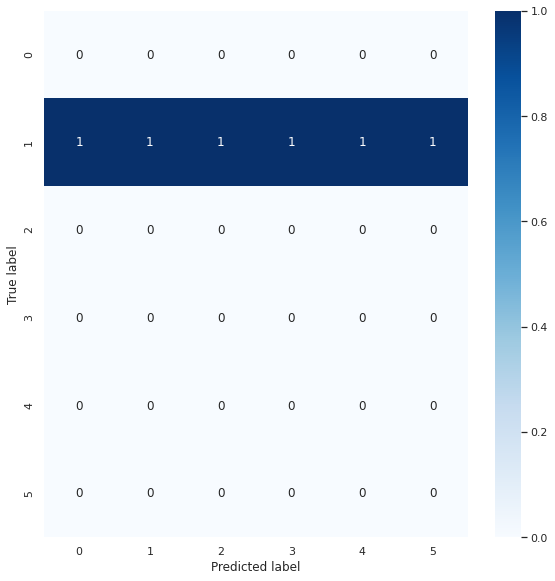

In [0]:
from sklearn import metrics
conf_matrix = metrics.confusion_matrix(y_test, y_pred.argmax(axis = 1))

figure = plt.figure(figsize=(8, 8))
sns.heatmap(conf_matrix, annot=True,cmap=plt.cm.Blues, fmt="d")
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()